In [1]:
import os
os.chdir("..")
print(os.getcwd())

import sys
from pathlib import Path
from importlib import reload

/home/bbd0953/diffusion/src


# Model Evaluation Pipeline

## Single Model Eval. (Unlabeled)

*Step 1: Sample*  
    Generate Samples by running sample_batch_st.py in terminal

*Step 2: Examples, Metrics & Distributions*  
Plot examples, calculate Metrics & Distributions, Plot with LOFAR stats  
(This will take a few minutes, run step 3 in the meantime)

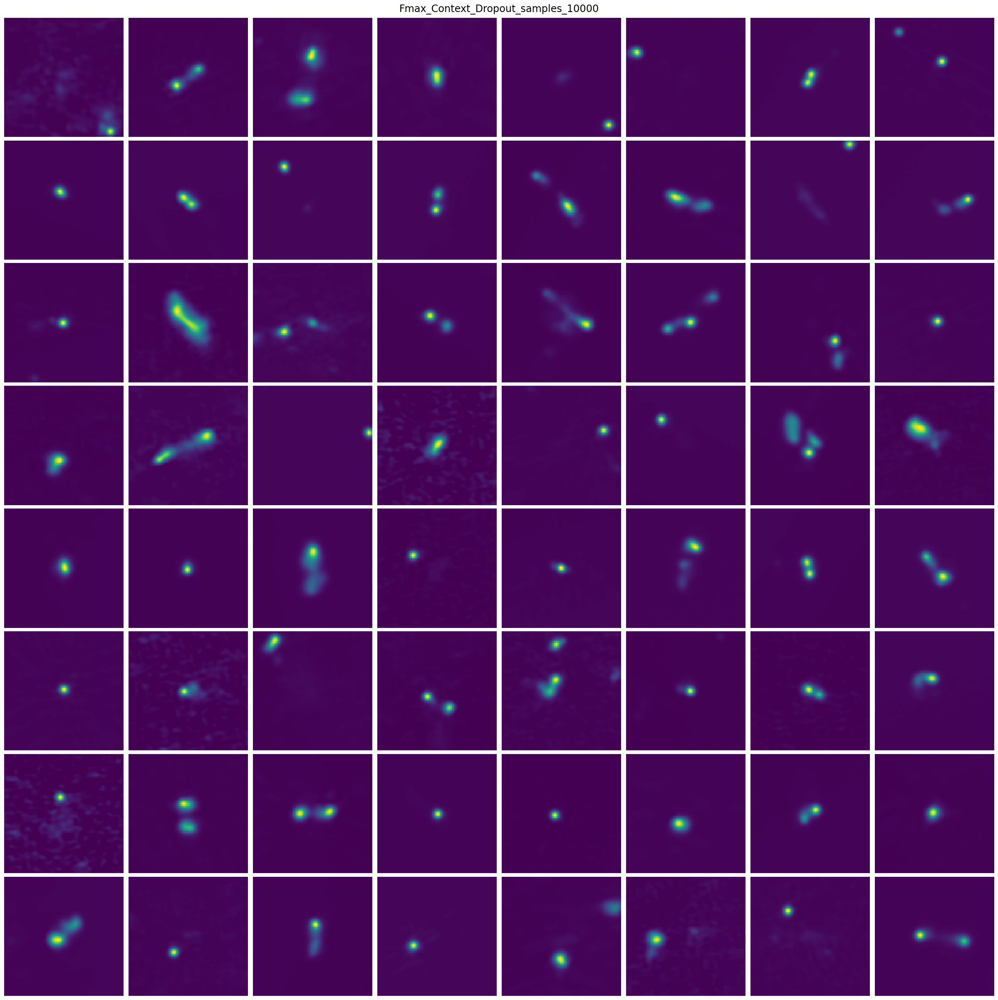

In [2]:
from importlib import reload
import analysis.model_evaluations as meval
from plotting.plot_images import plot_image_grid_from_file

file = Path(
    '/hs/fs08/data/group-brueggen/tmartinez/diffusion/analysis_results/Fmax_Context_Dropout/unconditioned/Fmax_Context_Dropout_samples_10000.pt'
)

fig_grid, _ = plot_image_grid_from_file(file, n_rows=8, vmin=0, vmax=None, save=True)
fig_grid.show()

Calculating metrics...


100%|██████████| 10000/10000 [00:16<00:00, 604.80it/s]


Calculating metric distributions...


100%|██████████| 12/12 [00:00<00:00, 1031.58it/s]

Found existing distribution file for Fmax_Context_Dropout_samples_10000_guidance_strength=1.00e-01.pt.
Found existing distribution file for lofar_120asLimit_80p_0-clipped_f-thr=0_SNR>=5_subset.hdf5.


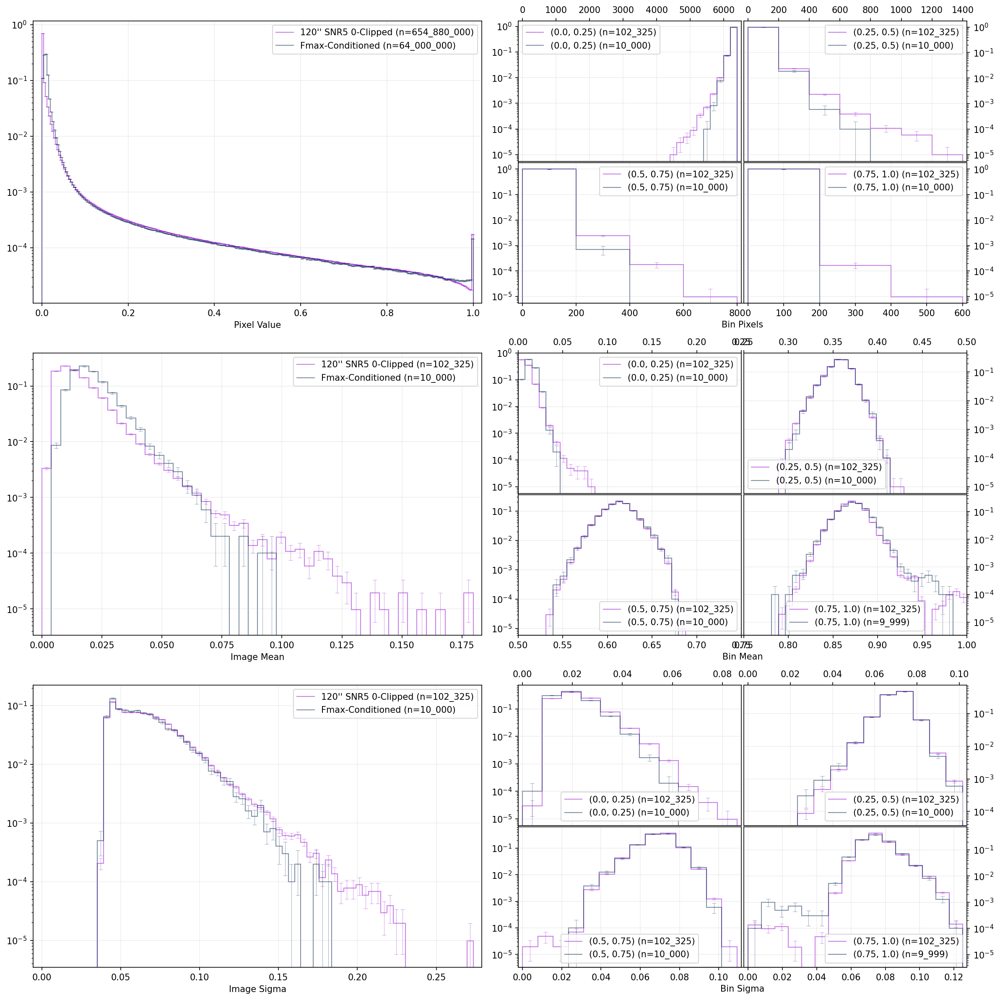

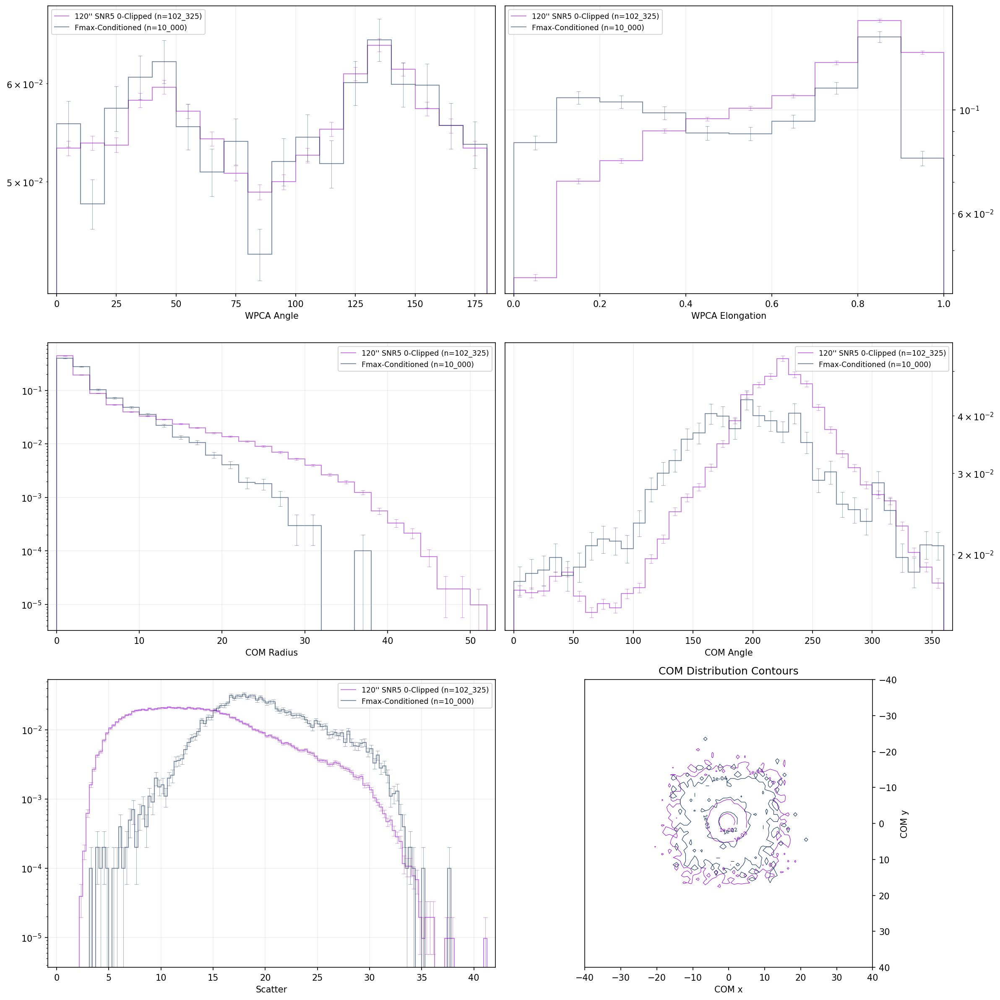

In [15]:
from pathlib import Path
from utils.paths import LOFAR_SUBSETS
import analysis.model_evaluations as meval
reload(meval)

distributions = meval.get_distributions(file, force=True)
figs = meval.get_metrics_plots(
    Path('/hs/fs08/data/group-brueggen/tmartinez/diffusion/analysis_results/Fmax_Context_Dropout/Fmax_Context_Dropout_samples_10000_guidance_strength=1.00e-01.pt'),#file,
    labels=['Fmax-Conditioned'],
    train_path=LOFAR_SUBSETS['0-clip_unscaled'],
    train_label='120\'\' SNR5 0-Clipped',
    save=False,
)

*Step 3: PyBDSF Run*  
Run bdsf_analysis.py on fs08, with the generated samples and if not done yet with training data.

*Step 3: PyBDSF Evaluation*  
Compare the results of PyBDSF analysis

Found existing distribution file for Fmax_Context_Dropout_samples_10000_guidance_strength=1.00e-01.pt.


Calculating metric distributions: 100%|██████████| 6/6 [00:00<00:00, 1416.68it/s]


Found existing distribution file for lofar_120asLimit_80p_0-clipped_f-thr=0_SNR>=5_subset.hdf5.


Calculating metric distributions: 100%|██████████| 6/6 [00:00<00:00, 174.52it/s]


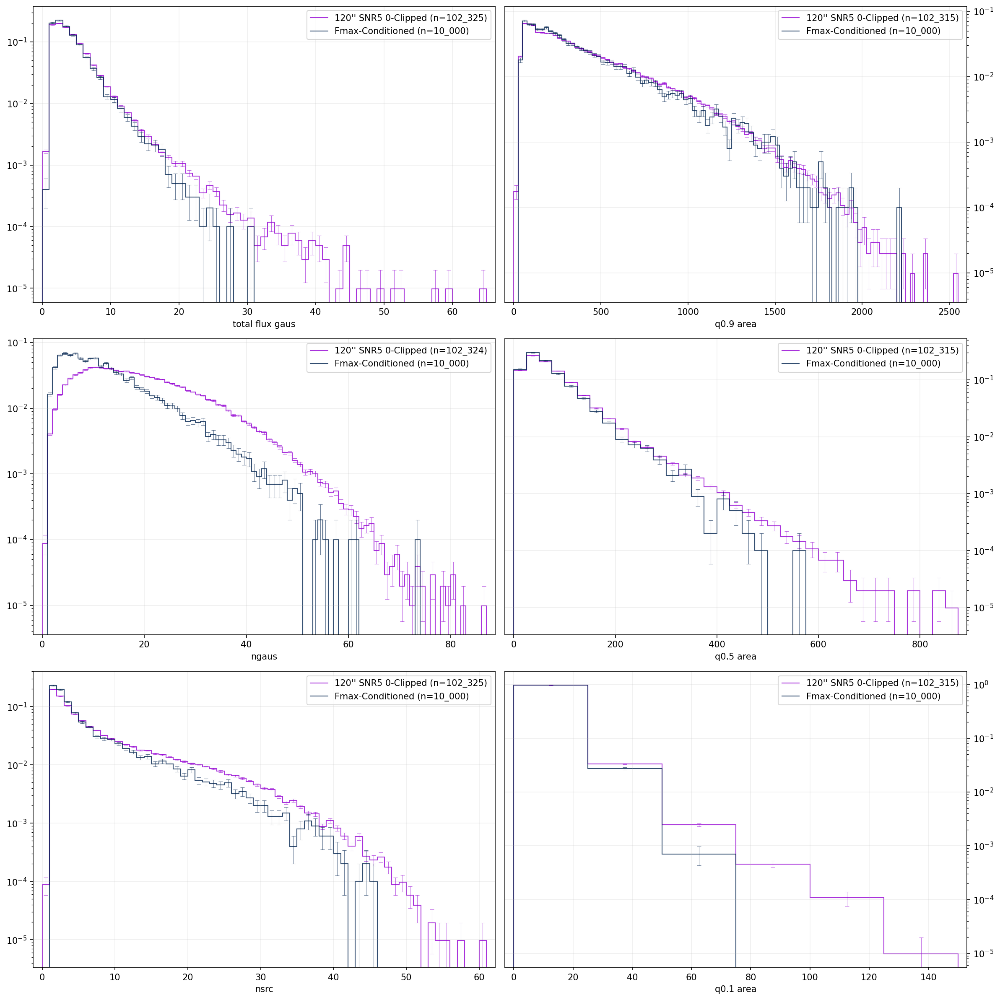

In [13]:
from utils.paths import LOFAR_SUBSETS
import analysis.bdsf_evaluation as bdsfeval
reload(bdsfeval)
from analysis.bdsf_evaluation import get_bdsf_metrics_plots

fig, ax = get_bdsf_metrics_plots(
    file,
    labels=['Fmax-Conditioned'],
    train_path=LOFAR_SUBSETS['0-clip_unscaled'],
    train_label='120\'\' SNR5 0-Clipped',
)

## Metric Peek (Sampling w. Context)

In [67]:
import torch
import numpy as np
import analysis.bdsf_evaluation as bdsfeval
reload(bdsfeval)

file = Path(
    '/hs/fs08/data/group-brueggen/tmartinez/diffusion/analysis_results/Fmax_Context_Dropout/Fmax_Context_Dropout_samples_10000_guidance_strength=1.00e-01.pt'
)

samples = torch.load(file, map_location='cpu')[:, -1].squeeze()
#context = np.load('/home/bbd0953/diffusion/analysis_results/Fmax_Context_Dropout/Fmax_Context_Dropout_context_10000_guidance_strength=1.00e-01.npy')

metrics = bdsfeval.get_metric_dict(file.parent, force=True)

100%|██████████| 10000/10000 [00:00<00:00, 39677.23it/s]


In [63]:
# Sort all elements in metrics by metrics['Image_id']
import numpy as np

sort_idxs = np.argsort(metrics['Image_id'] )
for key, value in metrics.items():
    metrics[key] = value[sort_idxs]

In [14]:
for key, arr in metrics.items():
    print(key, len(arr))

model_gaus_arr 10000
total_flux_gaus 10000
ngaus 10000
nsrc 10000
Image_id 10000
q0.9_area 10000
q0.5_area 10000
q0.1_area 10000


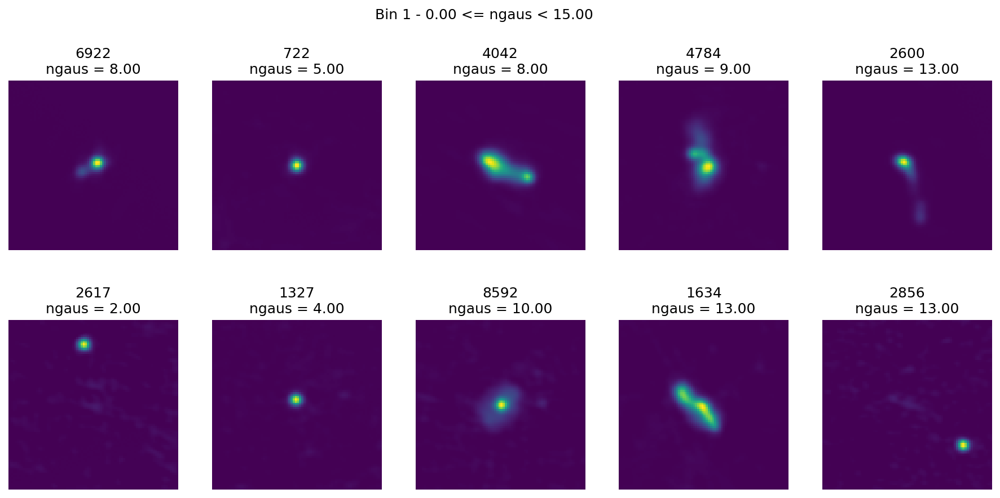

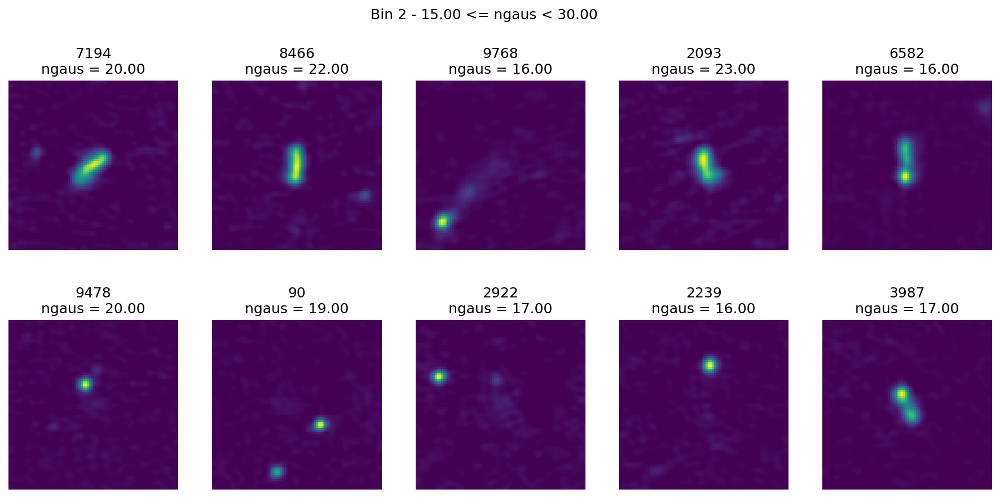

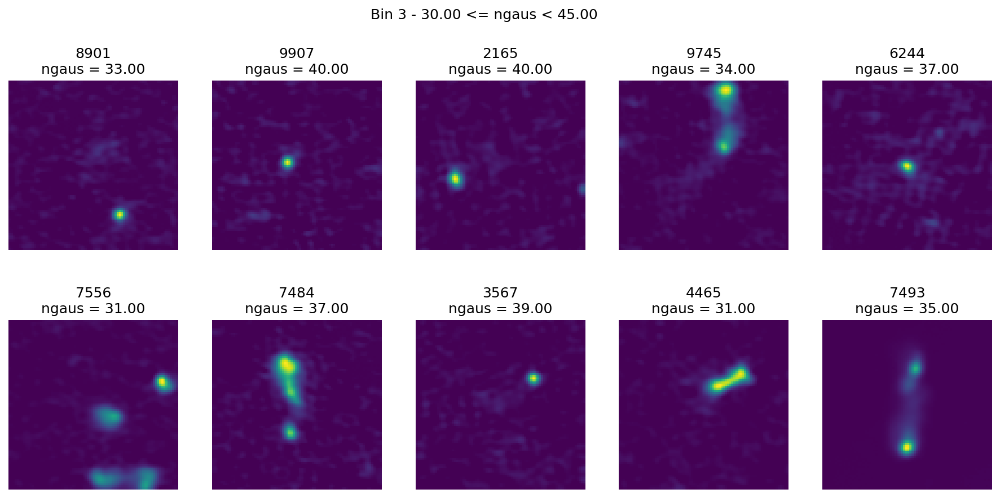

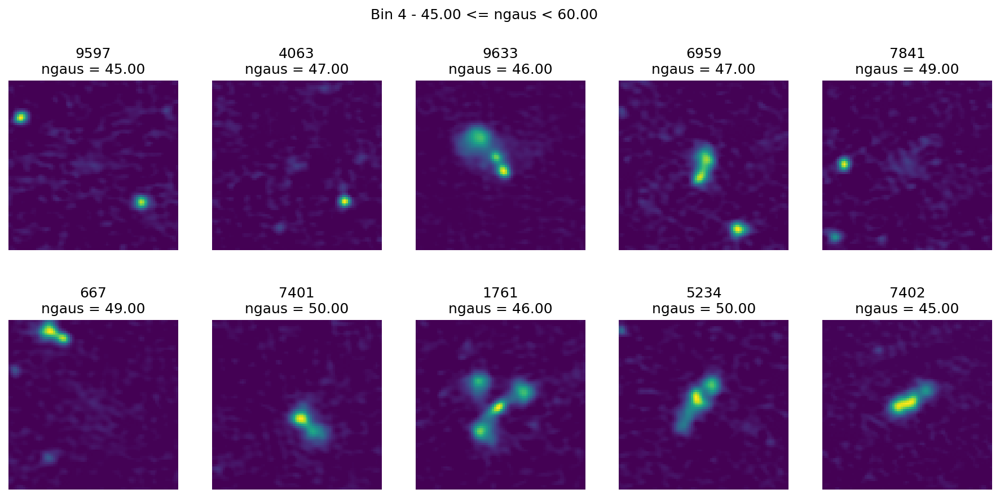

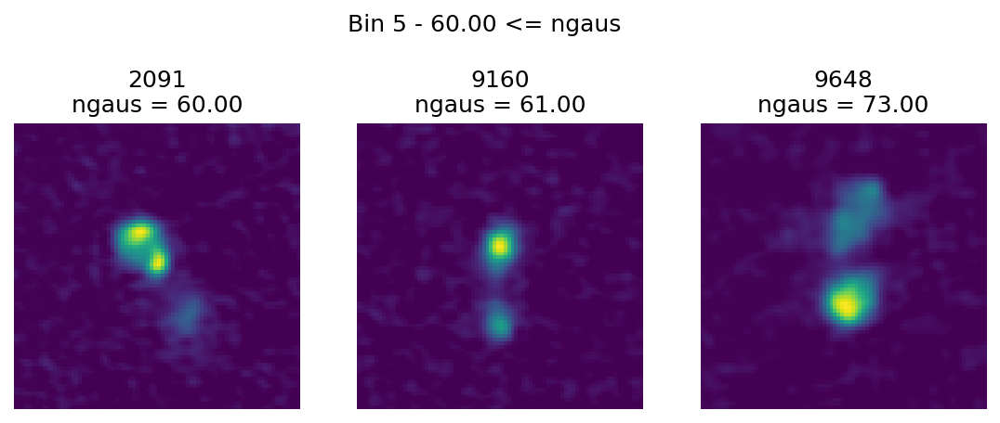

In [82]:
import plotting.plot_utils
reload(plotting.plot_utils)
from plotting.plot_images import metric_peek


metric_peek(
    metrics[m:='ngaus'],
    np.linspace(0, 60, 5),
    # metrics['model_gaus_arr'],
    samples,
    metric_name=m,
)

In [17]:
from utils.data_utils import EvaluationDataset

dset = EvaluationDataset(file)

Data set initialized.


In [26]:
import matplotlib.pyplot as plt
import numpy as np

i = np.random.randint(0, len(dset))
img = dset.data[i].squeeze()
img.min(), img.max()

(tensor(0.0049), tensor(1.))

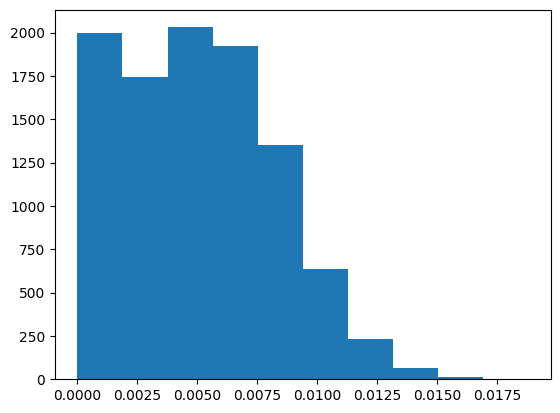

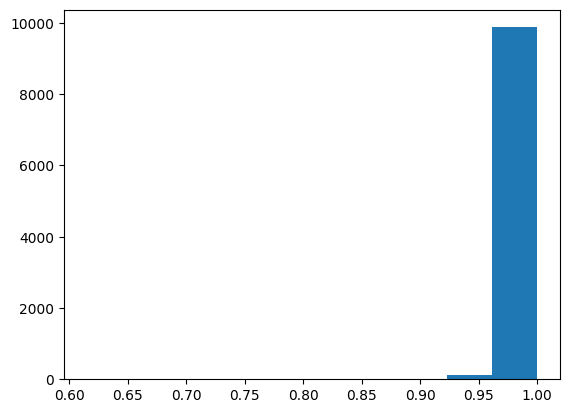

In [32]:
plt.hist(dset.data.squeeze().numpy().min(axis=(-1, -2)))
plt.show()
plt.hist(dset.data.squeeze().numpy().max(axis=(-1, -2)))
plt.show()

In [36]:
import utils.paths as paths

tset = EvaluationDataset(paths.LOFAR_SUBSETS['0-clip_unscaled'])


Loading images...


Data set initialized.


In [38]:
tset.data.shape

torch.Size([102325, 80, 80])

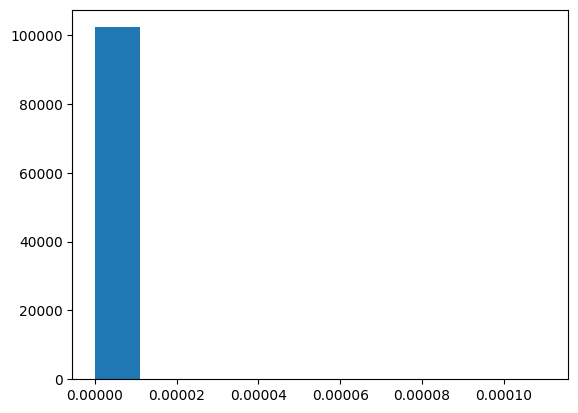

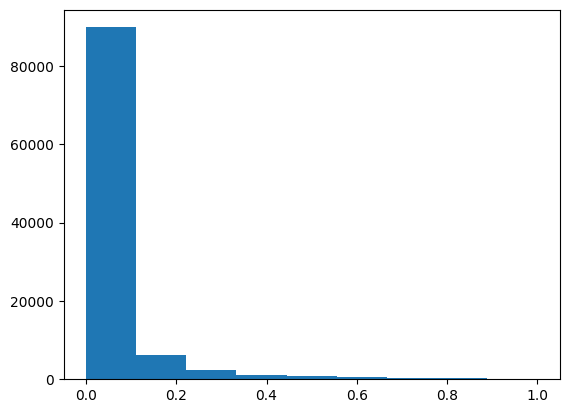

In [40]:
plt.hist(tset.data.squeeze().numpy().min(axis=(-1, -2)))
plt.show()
plt.hist(tset.data.squeeze().numpy().max(axis=(-1, -2)), bins=np.linspace(0, 1, 10))
plt.show()

In [49]:
from tqdm import tqdm

n = None
imgs = [tset[i] for i in tqdm(range(n or len(tset)))]
len(imgs)

100%|██████████| 102325/102325 [00:06<00:00, 16803.26it/s]


102325

## Compare between Models (Unlabeled)

Image Metrics:

/hs/fs08/data/group-brueggen/tmartinez/diffusion/src/analysis/model_evaluations.py:239: UserWarning: Multiple image directories passed to metrics plot, therefore save_fig is set to False.
  warnings.warn(


Found existing distribution file for Fmax_Context_Dropout_samples_10000_guidance_strength=1.00e-01.pt.
Found existing distribution file for Fmax_Context_Dropout_samples_10000.pt.
Found existing distribution file for lofar_120asLimit_80p_0-clipped_f-thr=0_SNR>=5_subset.hdf5.


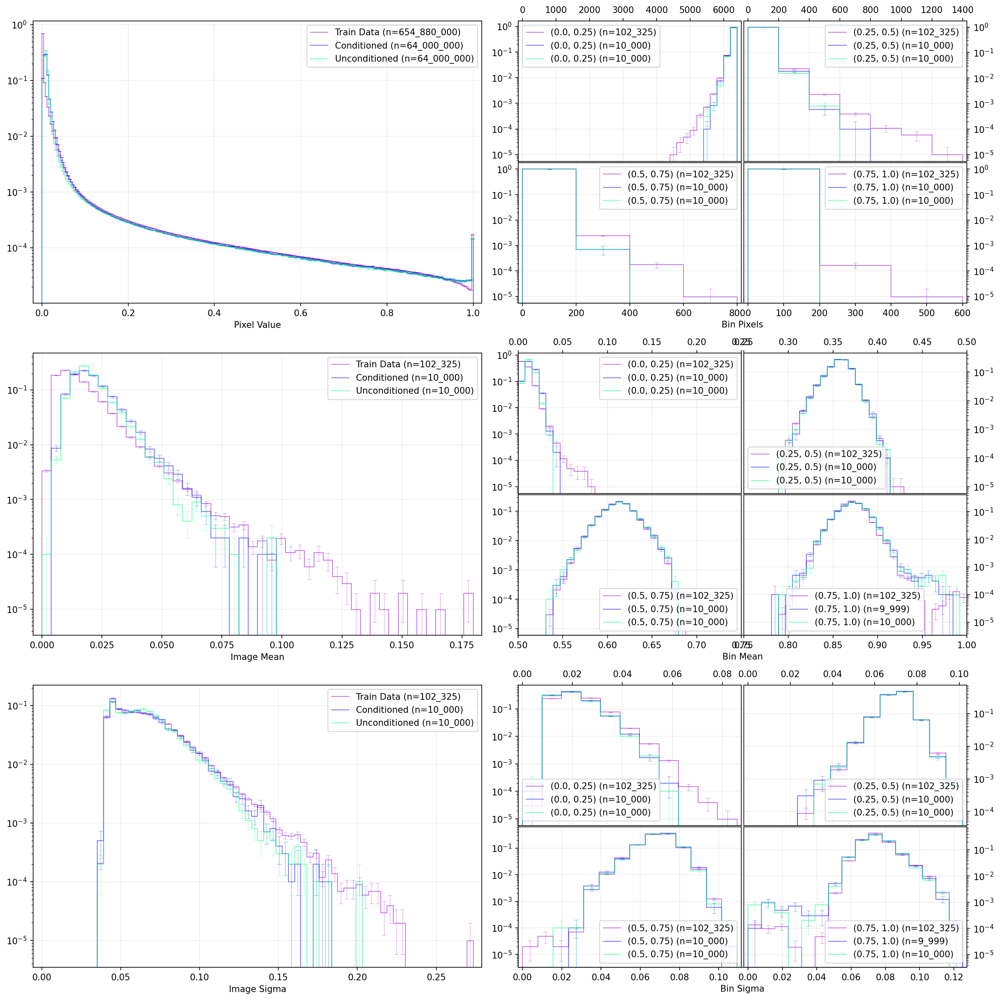

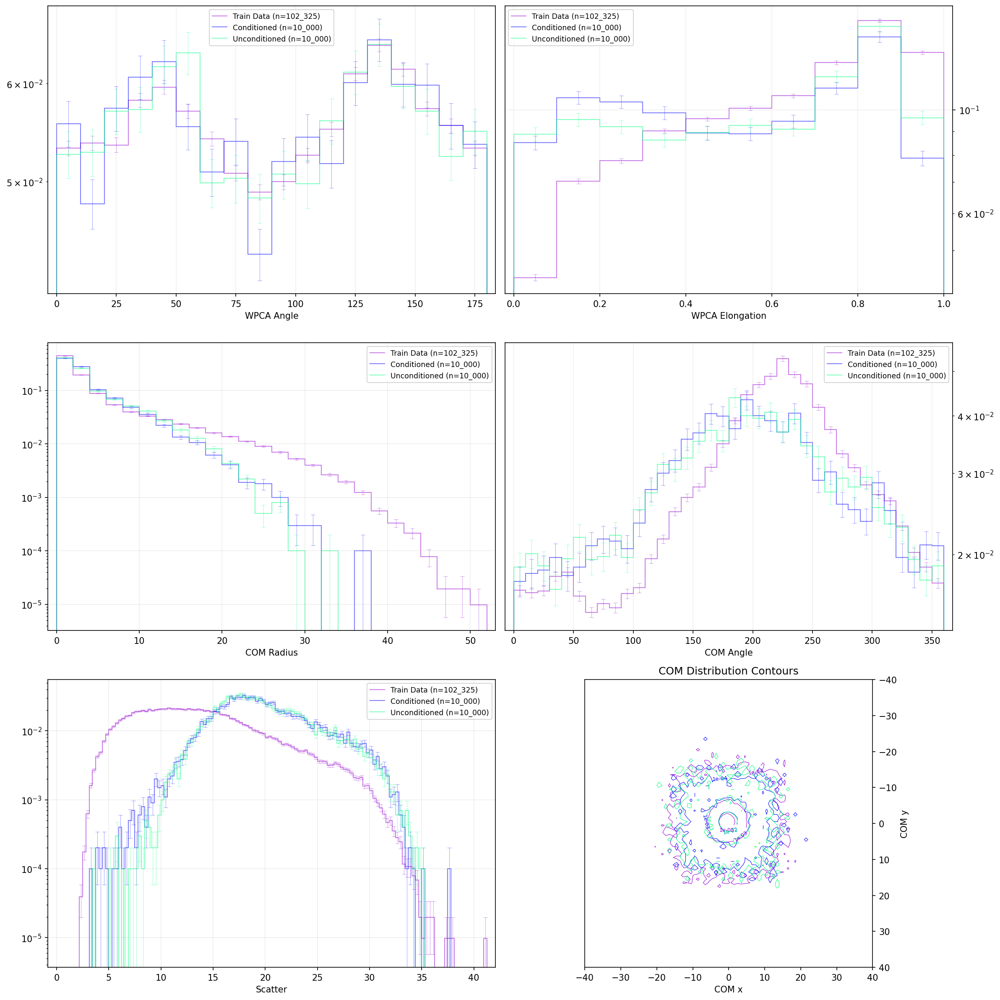

In [43]:
import utils.paths as paths
import analysis.model_evaluations as meval

model_name = 'Fmax_Context_Dropout'

files = [
    paths.ANALYSIS_PARENT/model_name/'Fmax_Context_Dropout_samples_10000_guidance_strength=1.00e-01.pt',
    paths.ANALYSIS_PARENT/model_name/'unconditioned/Fmax_Context_Dropout_samples_10000.pt',
    # paths.LOFAR_SUBSETS['0-clip_unscaled'],
]

# distributions = [meval.get_distributions(f) for f in files]
labels = [ 
    'Conditioned',
    'Unconditioned',
]


figs = meval.get_metrics_plots(
    files,
    labels=labels,
    cmap='winter',
    train_path=paths.LOFAR_SUBSETS['0-clip_unscaled'],
)

Found existing distribution file for Fmax_Context_Dropout_samples_10000_guidance_strength=1.00e-01.pt.


Calculating metric distributions: 100%|██████████| 6/6 [00:00<00:00, 1369.64it/s]

Found existing distribution file for Fmax_Context_Dropout_samples_10000.pt.



Calculating metric distributions: 100%|██████████| 6/6 [00:00<00:00, 1415.96it/s]


Found existing distribution file for lofar_120asLimit_80p_0-clipped_f-thr=0_SNR>=5_subset.hdf5.


Calculating metric distributions: 100%|██████████| 6/6 [00:00<00:00, 180.30it/s]


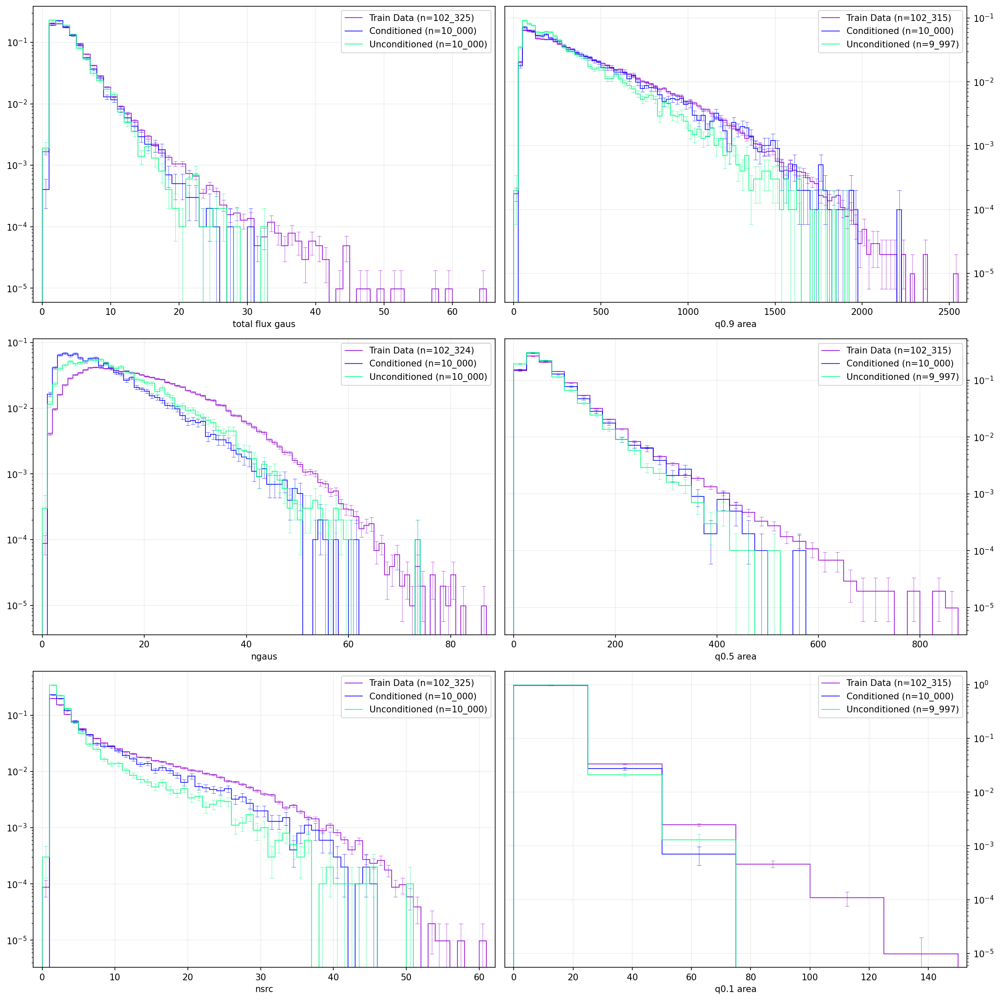

In [42]:
import analysis.bdsf_evaluation as bdsfeval

fig, ax = bdsfeval.get_bdsf_metrics_plots(
    files,
    labels=labels,
    train_path=paths.LOFAR_SUBSETS['0-clip_unscaled'],
    cmap='winter',
)

Loss vs Noise Level:

In [ ]:
import numpy as np
from importlib import reload
import plotting.plot_utils
reload(plotting.plot_utils)
from scripts.loss_vs_noise_level import plot_loss_over_noise_levels

files = [ ANALYSIS_PARENT / f for f in [
    # '/home/bbd0953/diffusion/analysis_results/EDM_valFix/noise_level_losses.npz',
    'EDM_Pmean=-2.5_Pstd=1.8/noise_level_losses.npz',
    'EDM_Pmean=-0.8_Pstd=2.2/noise_level_losses.npz',

]]

file_dicts = [np.load(f) for f in files]
plot_loss_over_noise_levels(
    file_dicts, labels=labels[1:], best_only=True,
    P_mean=[-2.5, -0.8], P_std=[1.8, 2.2]
)

## Class-Conditioned Model Eval 

_Step 1: Sample_  
Generate samples with model.samples

_Step 2: Distributions_  
Calculate distributions for each class label separately.

Selecting images with label(s) [0]
Loading images...
No names loaded from hdf5 file.
Data set initialized.
Selecting images with label(s) [1]
Loading images...
No names loaded from hdf5 file.
Data set initialized.
Selecting images with label(s) [2]
Loading images...
No names loaded from hdf5 file.
Data set initialized.
Selecting images with label(s) [3]
Loading images...
No names loaded from hdf5 file.
Data set initialized.


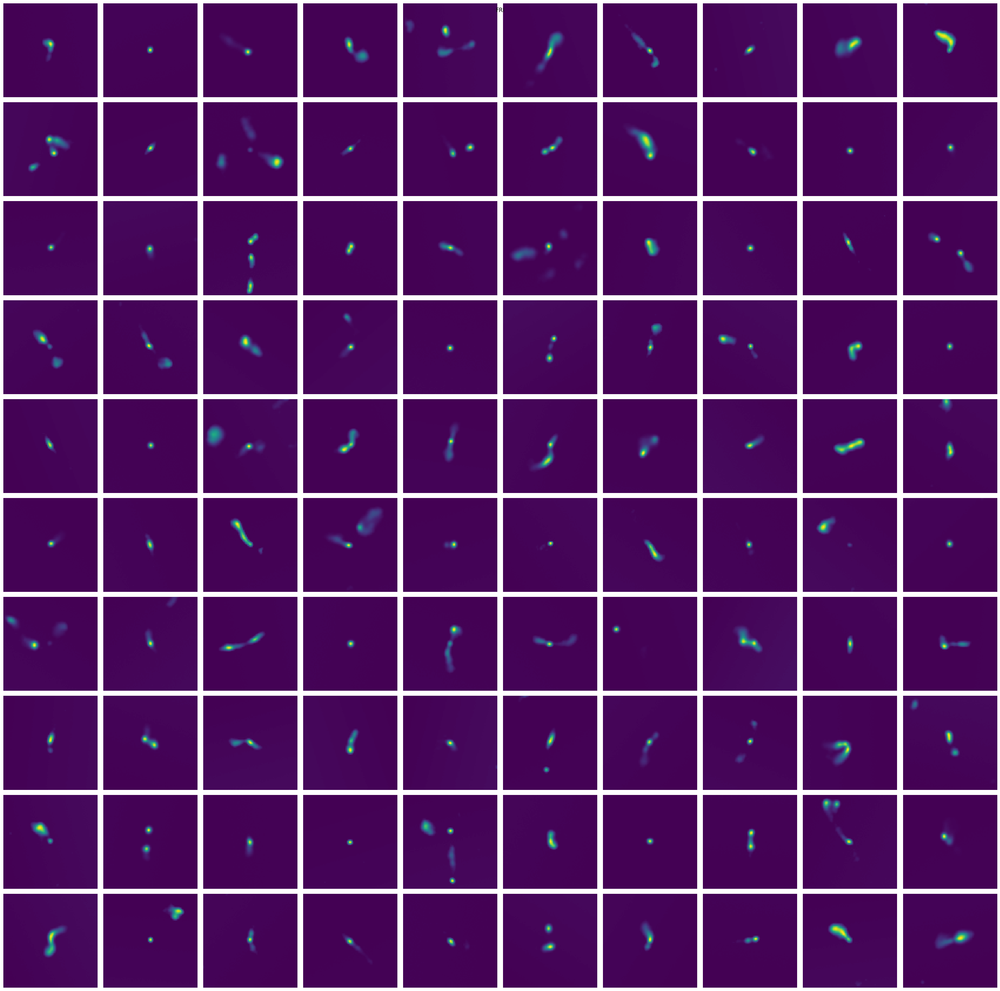

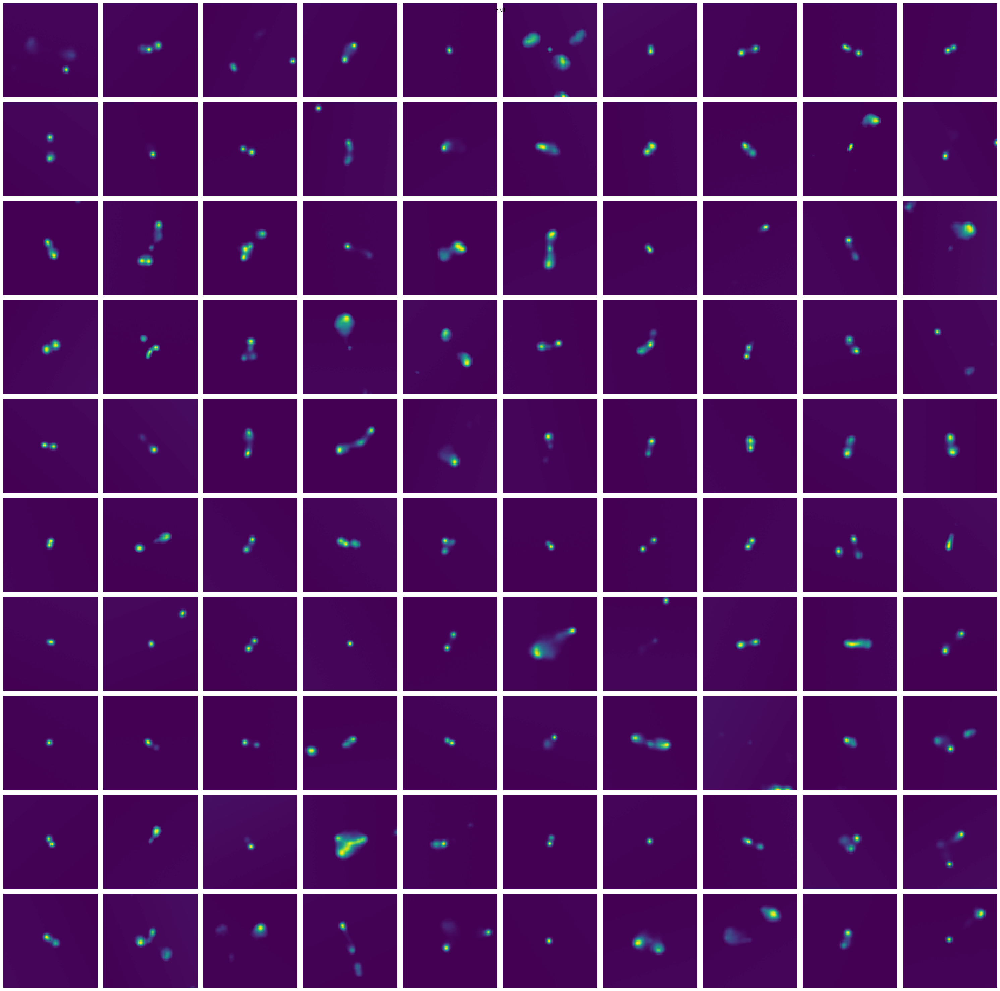

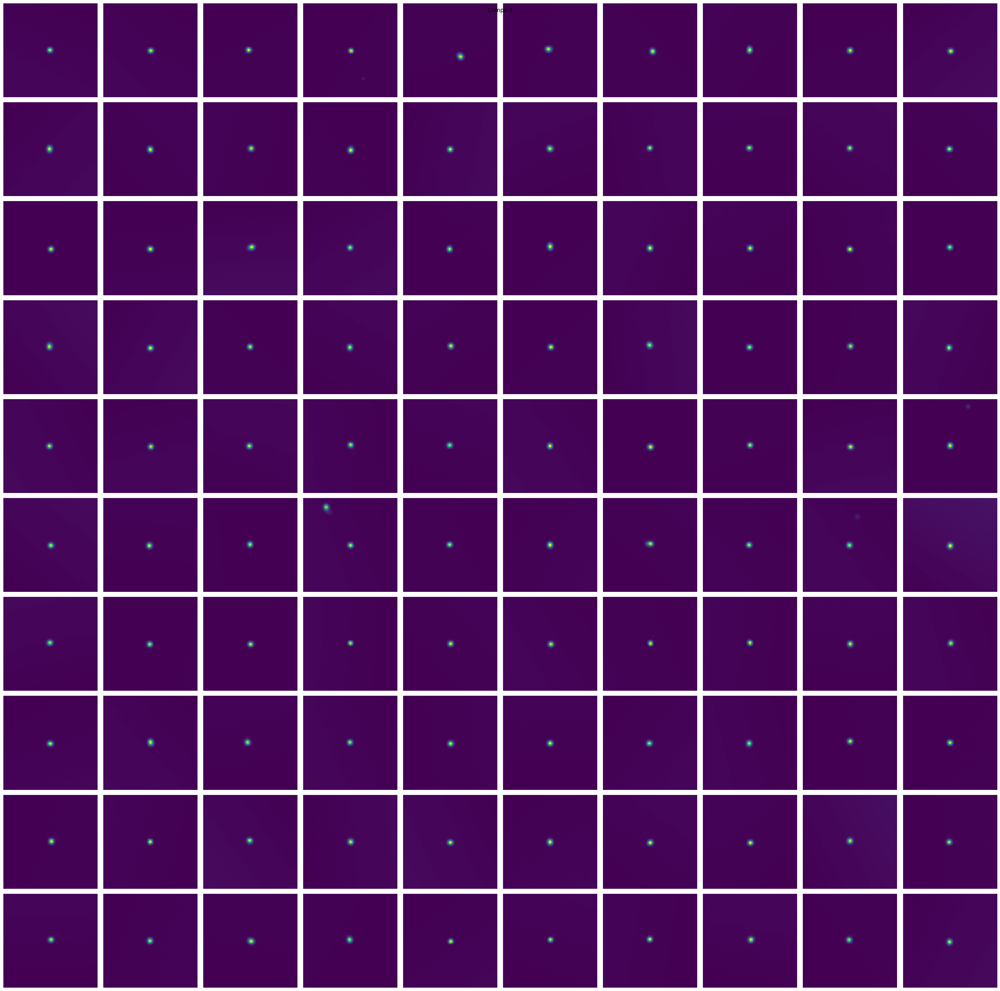

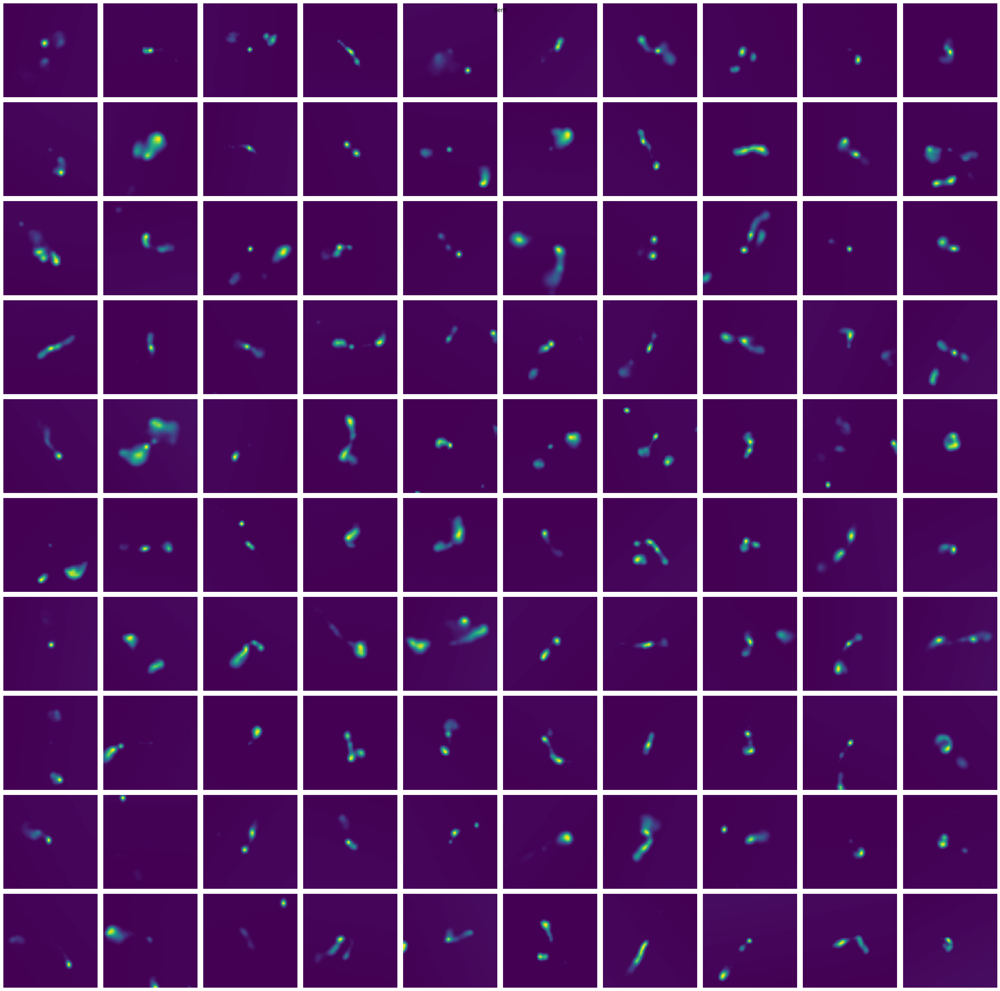

In [11]:
from importlib import reload
import analysis.model_evaluations as meval
from plotting.plot_images import plot_image_grid
from datasets.firstgalaxydata import label_to_class_dict
from utils.data_utils import EvaluationDataset
from torch.utils.data import DataLoader

file = Path(
    '/home/bbd0953/diffusion/image_data/generated/FIRST_Labeled_it=10k.h5'
)

h5_kwargs = {
    'key': 'samples_FIRST_Labeled_it=10k',
}

lbl2cls = label_to_class_dict()

for label, cl in lbl2cls.items():
    images = EvaluationDataset(file, labels=[label], **h5_kwargs)
    loader = DataLoader(images, batch_size=100, shuffle=True)
    fig_grid, _ = plot_image_grid(
        next(iter(loader)), n_rows=10, vmin=0, vmax=1, suptitle=cl,
    )
    fig_grid.suptitle(cl)
    fig_grid.show()

Selecting images with label(s) [0]
Loading images...
No names loaded from hdf5 file.
Data set initialized.
Calculating metrics...


100%|██████████| 1000/1000 [00:02<00:00, 442.91it/s]


Calculating metric distributions...


100%|██████████| 12/12 [00:00<00:00, 6070.64it/s]


Loading distribution file for FIRST_FRI_metrics.npy.
Selecting images with label(s) [1]
Loading images...
No names loaded from hdf5 file.
Data set initialized.
Calculating metrics...


100%|██████████| 1000/1000 [00:02<00:00, 436.36it/s]


Calculating metric distributions...


100%|██████████| 12/12 [00:00<00:00, 4431.77it/s]


Loading distribution file for FIRST_FRII_metrics.npy.
Selecting images with label(s) [2]
Loading images...
No names loaded from hdf5 file.
Data set initialized.
Calculating metrics...


100%|██████████| 1000/1000 [00:02<00:00, 447.92it/s]


Calculating metric distributions...


100%|██████████| 12/12 [00:00<00:00, 6148.50it/s]


Loading distribution file for FIRST_Compact_metrics.npy.
Selecting images with label(s) [3]
Loading images...
No names loaded from hdf5 file.
Data set initialized.
Calculating metrics...


100%|██████████| 1000/1000 [00:02<00:00, 431.90it/s]


Calculating metric distributions...


100%|██████████| 12/12 [00:00<00:00, 6449.47it/s]


Loading distribution file for FIRST_Bent_metrics.npy.


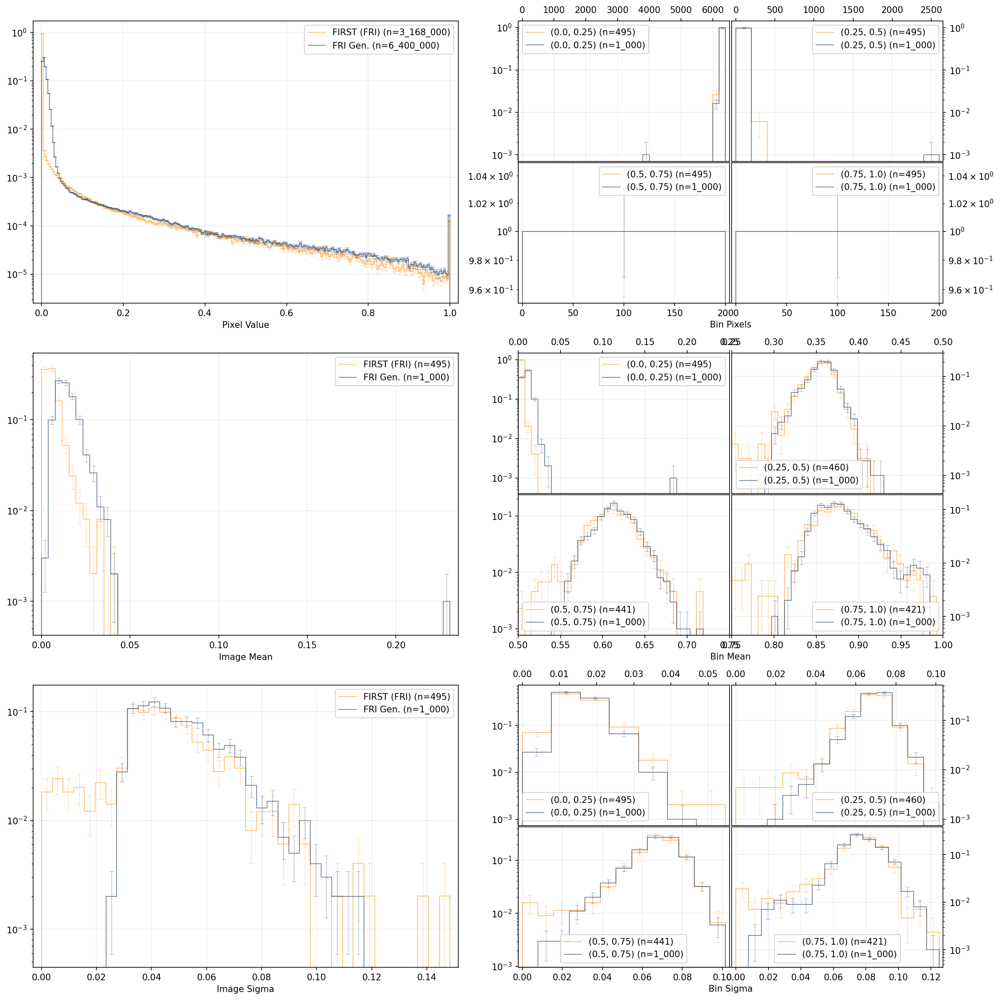

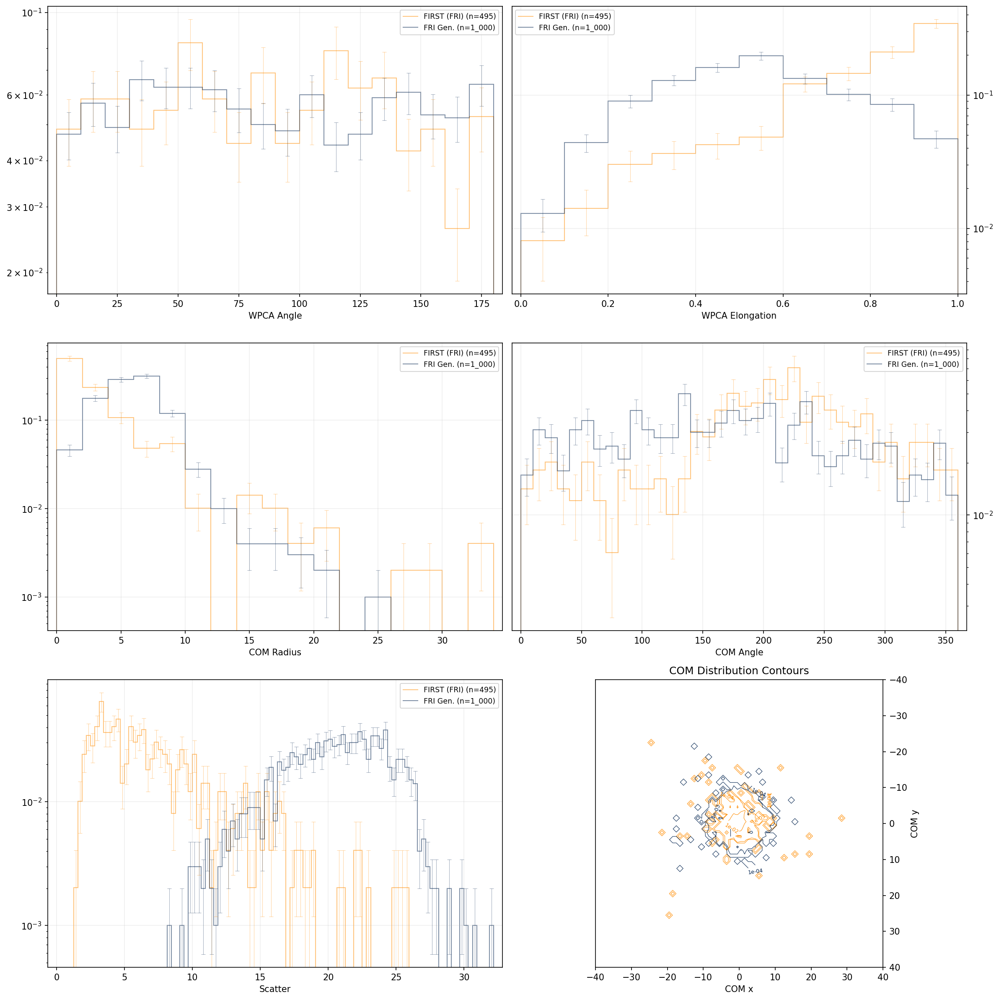

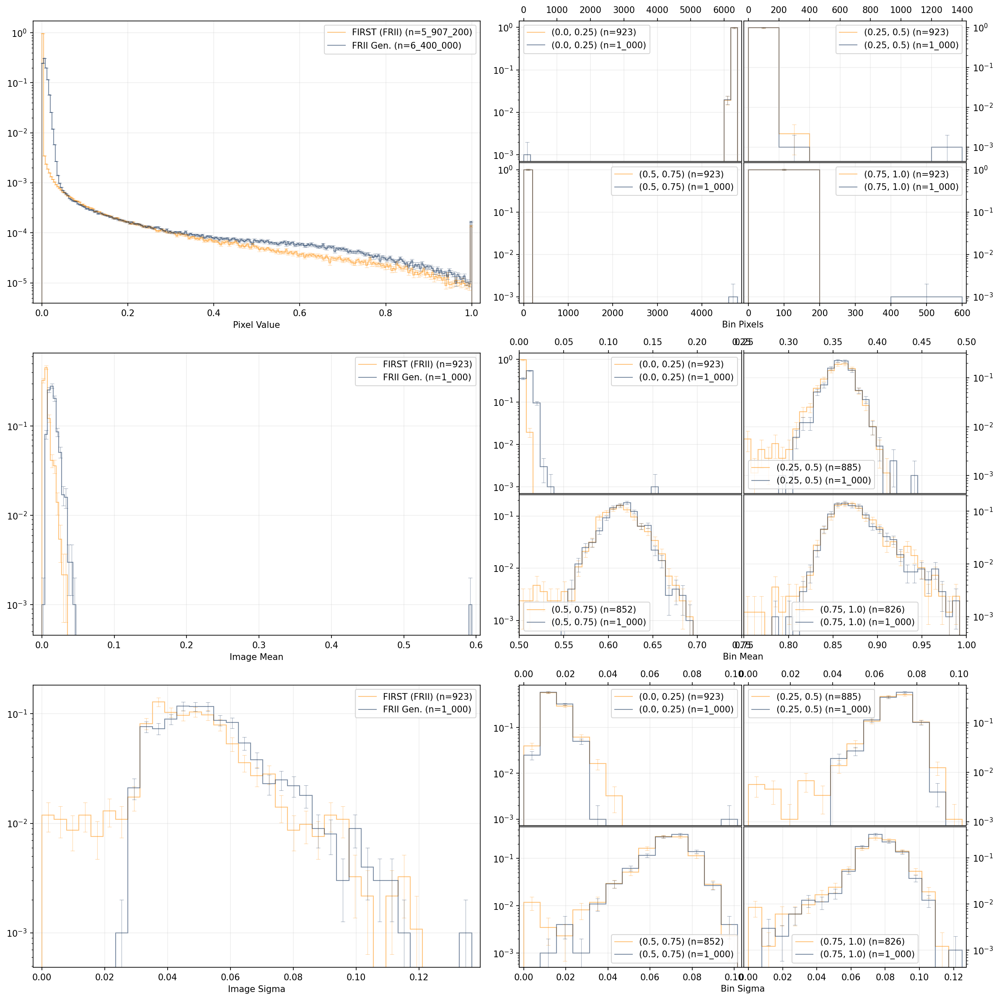

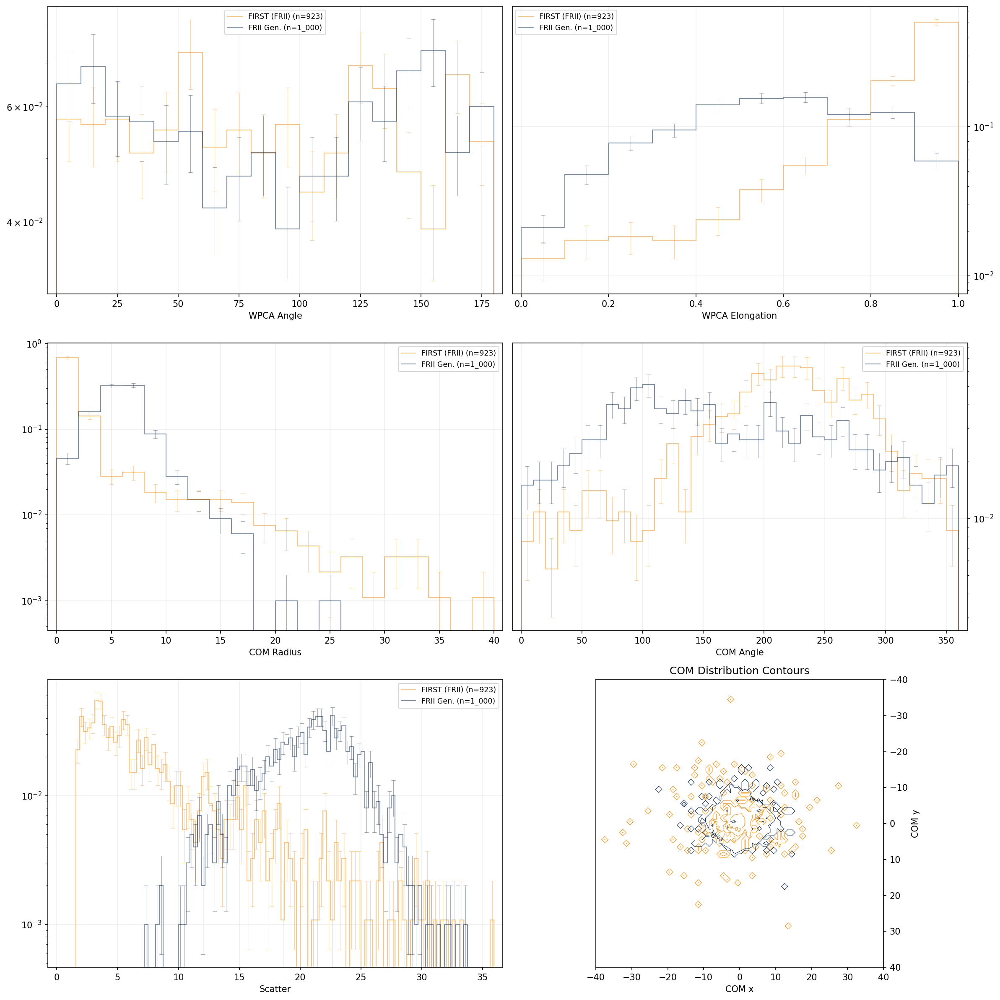

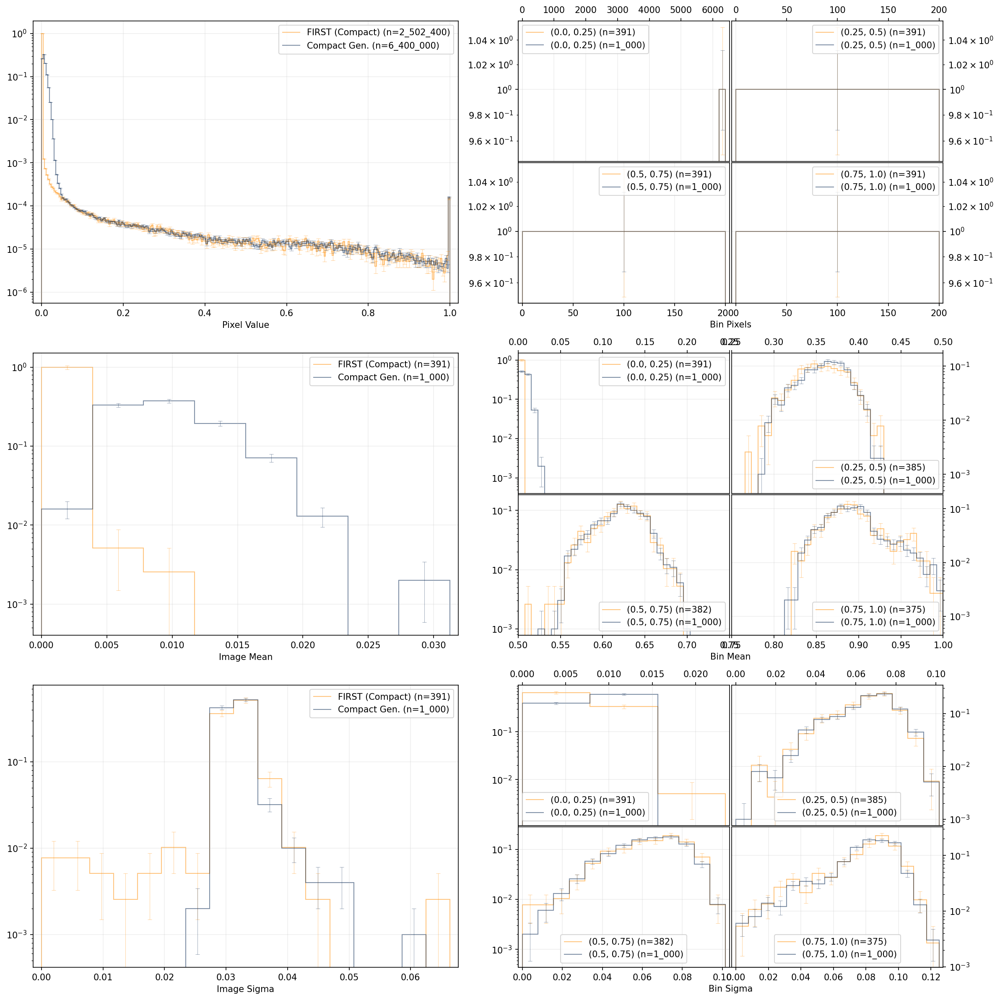

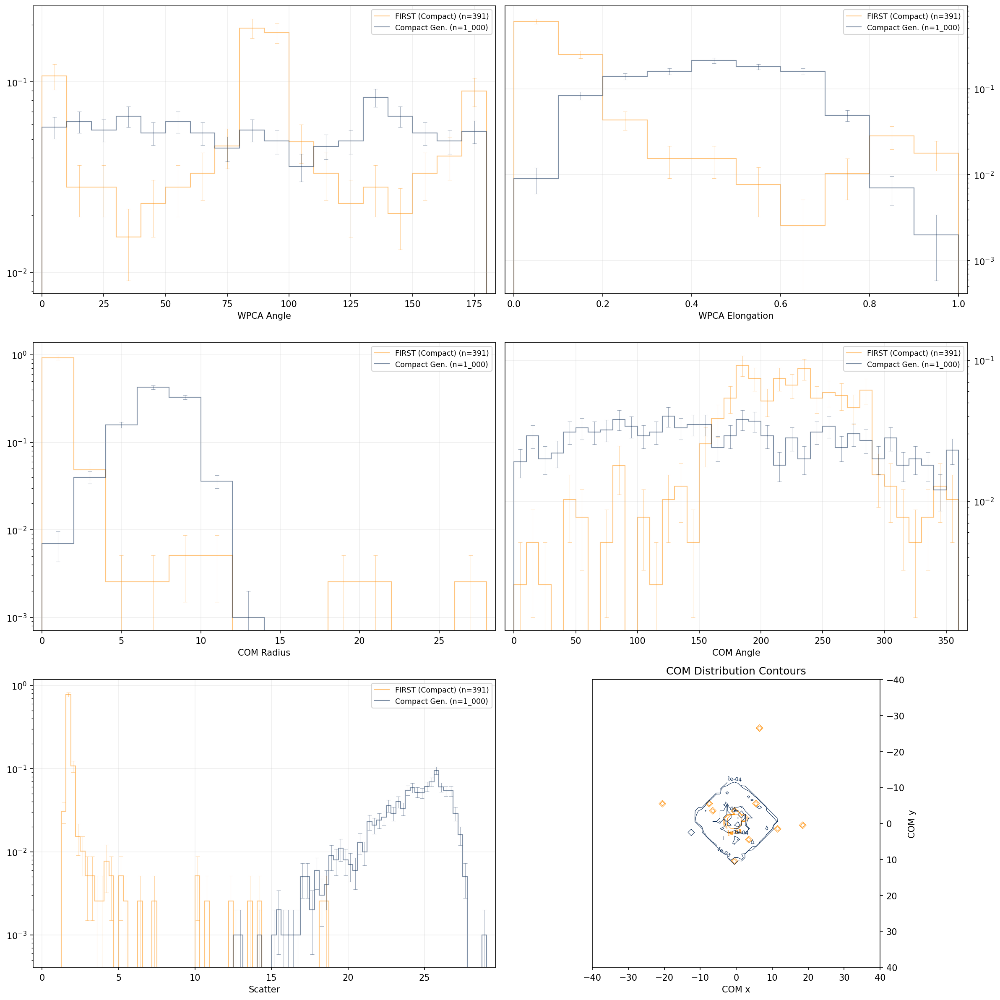

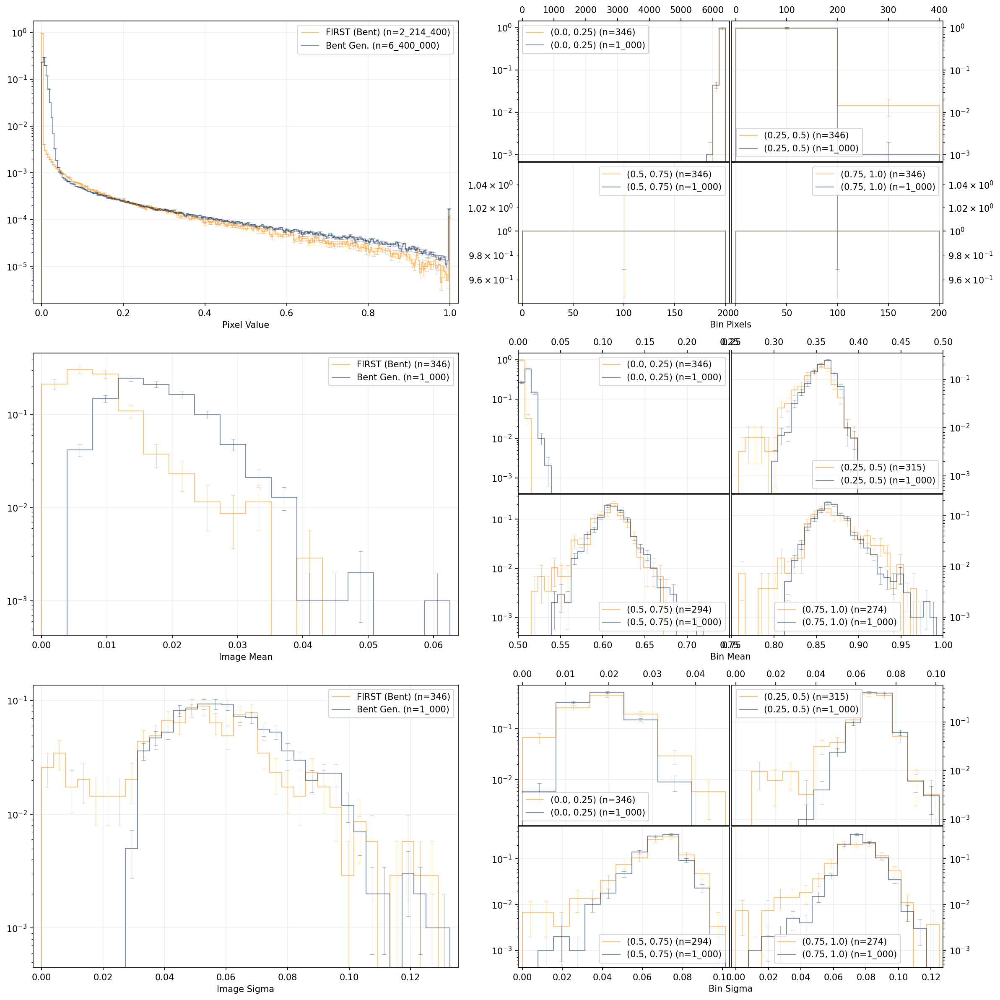

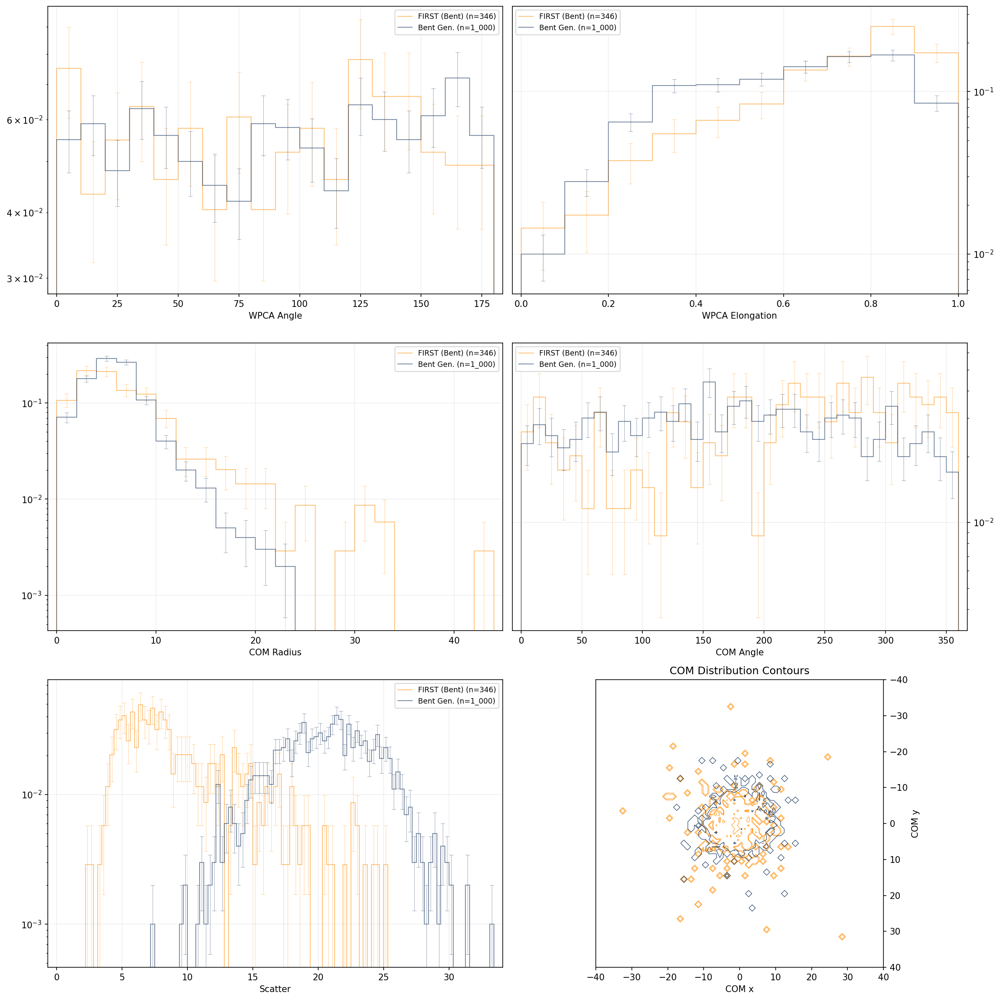

In [2]:
from pathlib import Path
from utils.paths import LOFAR_SUBSETS, ANALYSIS_PARENT
import utils.data_utils as du
import analysis.model_evaluations as meval
from importlib import reload
from datasets.firstgalaxydata import label_to_class_dict

reload(du)
reload(meval)


file = Path(
    '/home/bbd0953/diffusion/image_data/generated/FIRST_Labeled_it=10k.h5'
)

h5_kwargs = {
    'key': 'samples_FIRST_Labeled_it=10k',
}

lbl2cls = label_to_class_dict()

figax_list = []
for label in lbl2cls.keys():
    h5_kwargs['labels'] = [label]
    cl = lbl2cls[label]
    figax = meval.get_metrics_plots(
        file, labels=[f'{cl} Gen.'], h5_kwargs=h5_kwargs,
        train_label=f'FIRST ({cl})',
        train_path=ANALYSIS_PARENT / 'FIRST' / f'FIRST_{cl}_metrics.npy',
        force=True,
    )
    figax_list.append(figax)

## Compare Snapshots

Step 1: Sample from snapshots by running sample_snapshot_loop() from sample_batch_st.py in terminal.  
Samples are saved under: _ANALYSIS_PARENT/[model name]/snapshot_samples_

Step 2: Calculate stats and distributions for all snapshot samples.

Working on EDM_SNR5_120as_samples_it=20000_4000Imgs_T=25.pt...
Found existing distribution file for EDM_SNR5_120as_samples_it=20000_4000Imgs_T=25.pt.
Working on EDM_SNR5_120as_samples_it=40000_4000Imgs_T=25.pt...
Found existing distribution file for EDM_SNR5_120as_samples_it=40000_4000Imgs_T=25.pt.
Working on EDM_SNR5_120as_samples_it=60000_4000Imgs_T=25.pt...
Found existing distribution file for EDM_SNR5_120as_samples_it=60000_4000Imgs_T=25.pt.
Working on EDM_SNR5_120as_samples_it=80000_4000Imgs_T=25.pt...
Found existing distribution file for EDM_SNR5_120as_samples_it=80000_4000Imgs_T=25.pt.
Found existing distribution file for EDM_SNR5_120as_samples_it=60000_4000Imgs_T=25.pt.
Found existing distribution file for EDM_SNR5_120as_samples_it=80000_4000Imgs_T=25.pt.
Found existing distribution file for EDM_SNR5_120as_samples_10000Imgs_T=25.pt.
Found existing distribution file for lofar_120asLimit_80p_unclipped_f-thr=0_SNR>=5_subset.hdf5.


/home/bbd0953/diffusion/src/analysis/model_evaluations.py:238: UserWarning: Multiple image directories passed to metrics plot, therefore save_fig is set to False.
  


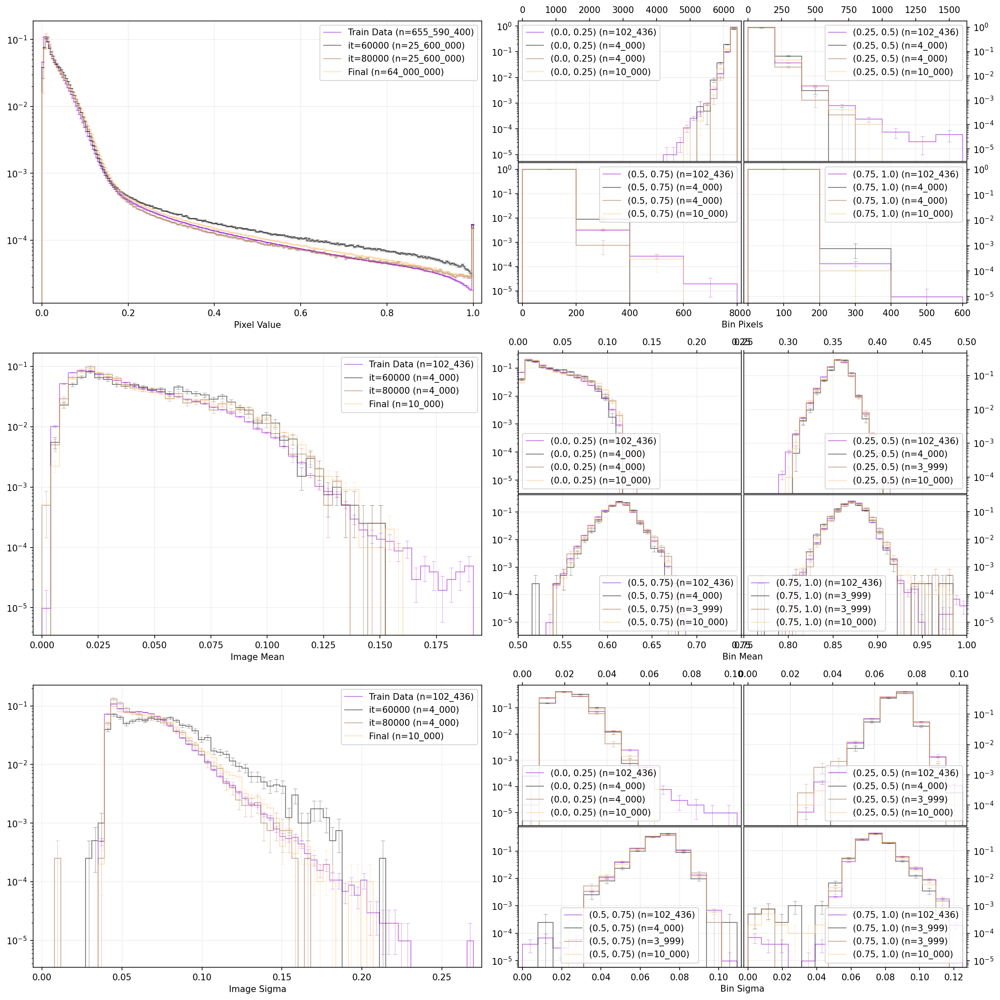

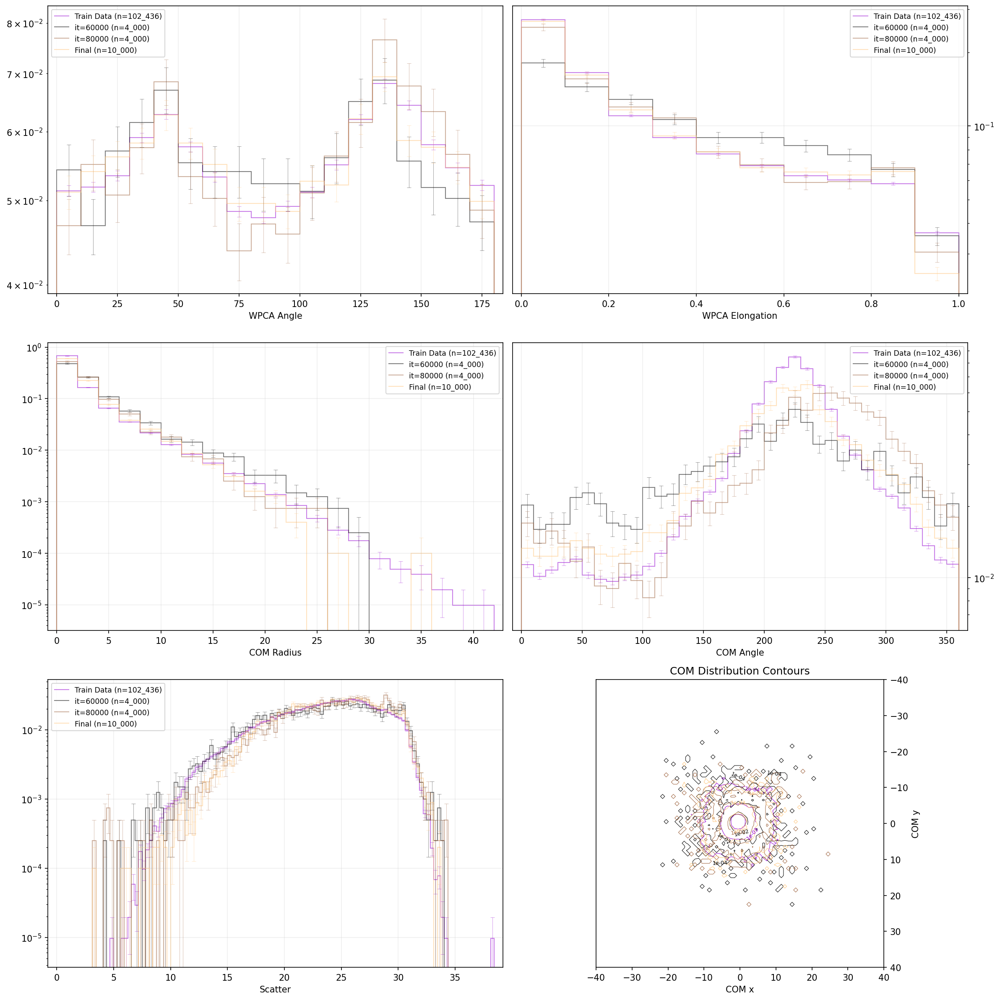

In [14]:
from utils.paths import ANALYSIS_PARENT, LOFAR_SUBSETS
import analysis.model_evaluations as meval
reload(meval)

model_name = 'EDM_SNR5_120as'  # Add model name here
train_path = LOFAR_SUBSETS['120asLimit_SNR>=5']  # Add training data path here

# Optional, else set to None:
final_samples_file = '/home/bbd0953/diffusion/analysis_results/EDM_SNR5_120as/EDM_SNR5_120as_samples_10000Imgs_T=25.pt'

samples_files = sorted(
    (ANALYSIS_PARENT / model_name / 'snapshot_samples').glob(f'{model_name}_samples*.pt')
)

for f in samples_files:
    print(f'Working on {f.name}...')
    distributions = meval.get_distributions(f)

labels = [
    s for f in samples_files for s in f.name.split('_') if 'it=' in s
]


if final_samples_file is not None:
    samples_files.append(Path(final_samples_file))
    labels.append('Final')

n_min, n_max = 2, None

figs = meval.get_metrics_plots(
    samples_files[n_min:n_max],
    labels=labels[n_min:n_max],
    cmap='copper',
    train_path=train_path,
)

In [ ]:
from pathlib import Path

samples_files = [Path(p) for p in [
    '/path/something_blabla_it=1000.pt',
    '/path/something_blabla_it=10000.pt',
    '/path/something_blabla_it=100000.pt',
]]

labels = [
    s for n in samples_files for s in n.name.split('_') 
    if 'it=' in s
]

labels

## Loss vs. Noise Level

*Compute Loss vs. Noise*  
Calculate loss vs. noise level by running loss_vs_noise_level.py

*Plot Loss vs Noise*  
Plot loss vs. noise level

(<Figure size 1500x750 with 1 Axes>,
 <Axes: xlabel='Noise Level', ylabel='L2 Loss'>)

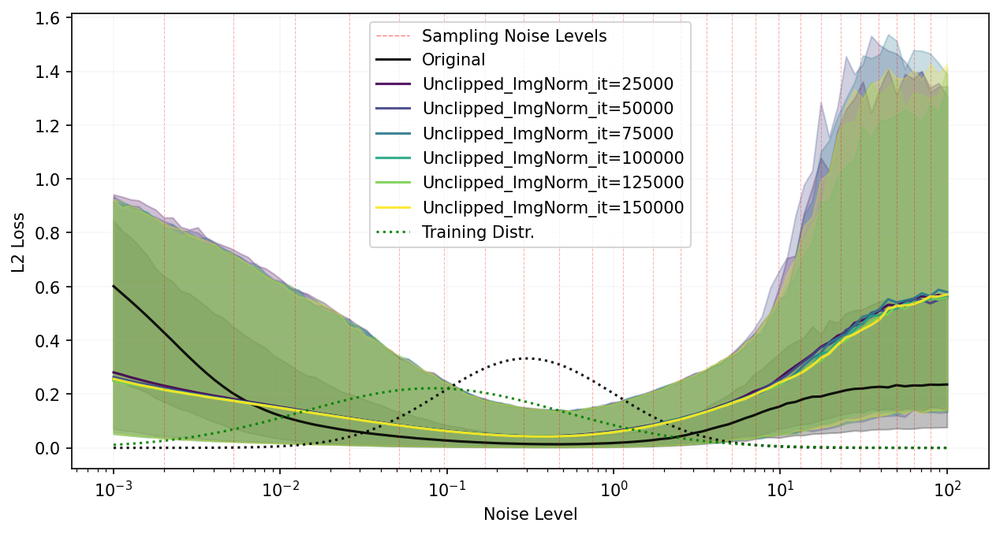

In [ ]:
import numpy as np
from importlib import reload
import plotting.plot_utils
reload(plotting.plot_utils)
from scripts.loss_vs_noise_level import plot_loss_over_noise_levels

file = Path(
    '/home/bbd0953/diffusion/analysis_results/Unclipped_H5/noise_level_losses.npz'
)

file_dict = np.load(file)
plot_loss_over_noise_levels(
    file_dict, labels='Unclipped_ImgNorm',
    P_mean=[-2.5], P_std=[1.8],
    savefig=file.parent / f'{file.parent.name}_{file.stem}.png'
)

# Train Data

## FIRST Dataset

Load Dataset:

In [18]:
from importlib import reload
import datasets.firstgalaxydata
reload(datasets.firstgalaxydata)
from datasets.firstgalaxydata import FIRSTGalaxyData
import utils.data_utils
reload(utils.data_utils)
from utils.data_utils import train_transform, eval_transform, eval_transform_FIRST
import torchvision.transforms as tr
import torch

dataset = FIRSTGalaxyData(
    selected_split=['test', 'train', 'valid'],
    transform=eval_transform_FIRST(80), is_balanced=False,
)

Removing images where all pixels are zero after transform...
	Removed 3 images.


### Plot Image Grids

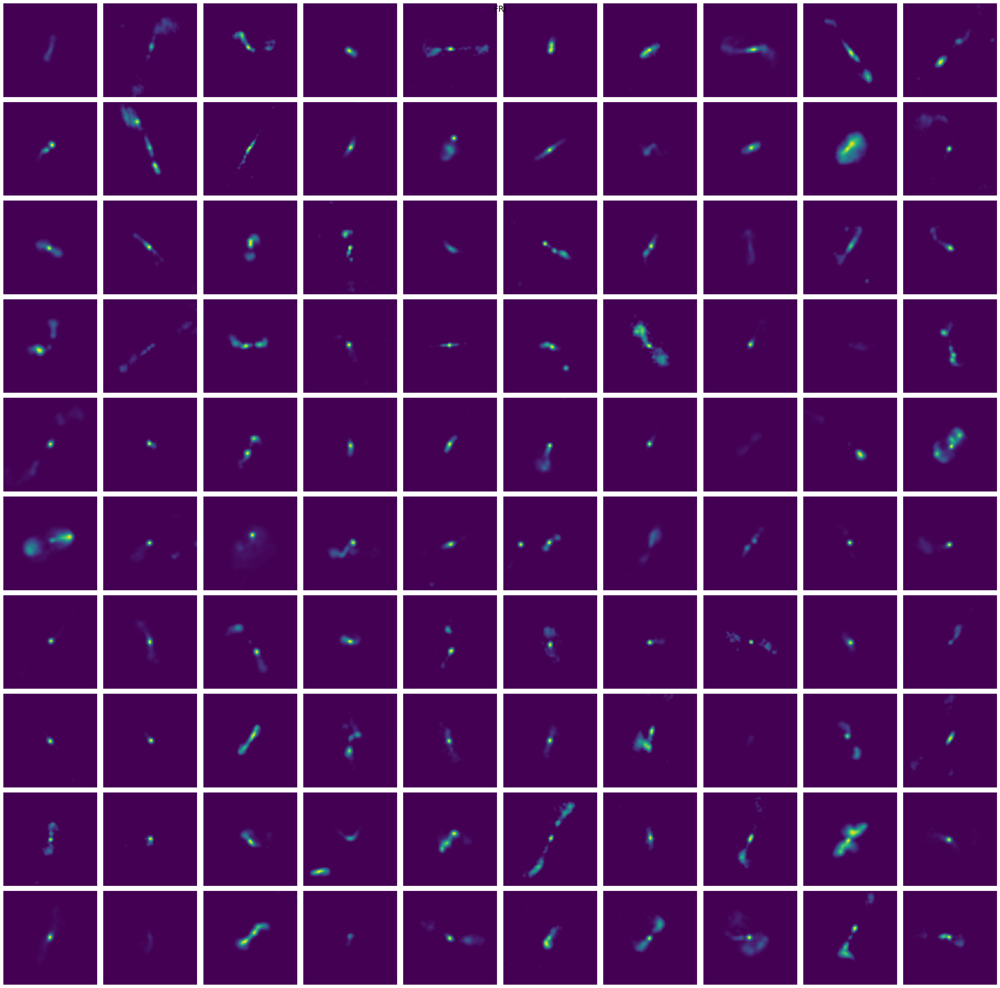

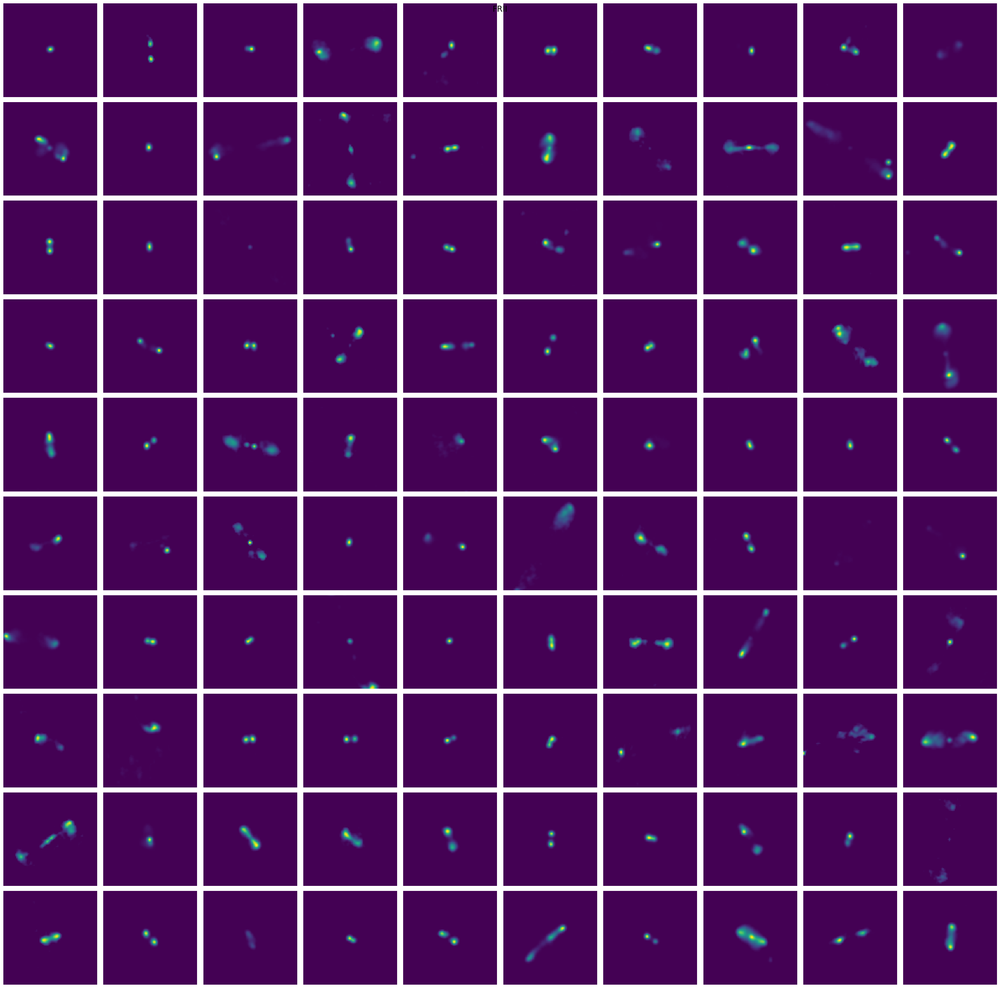

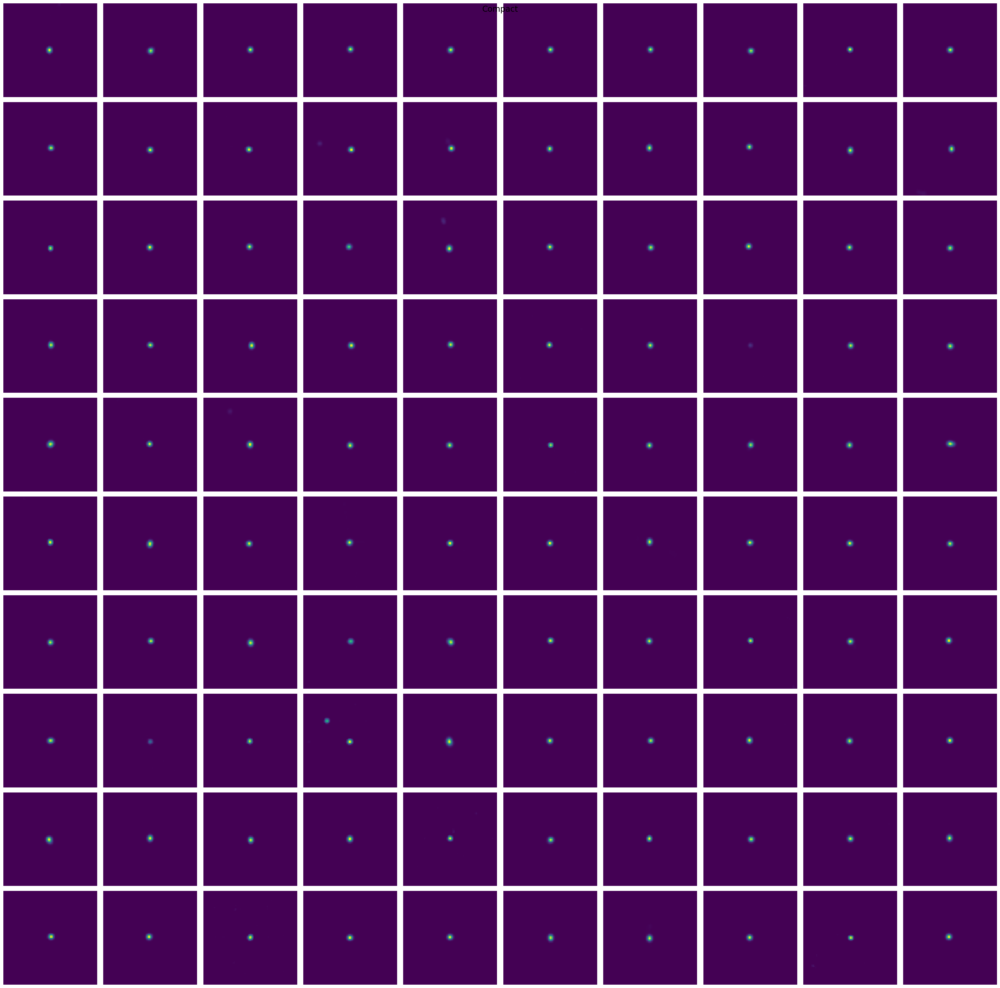

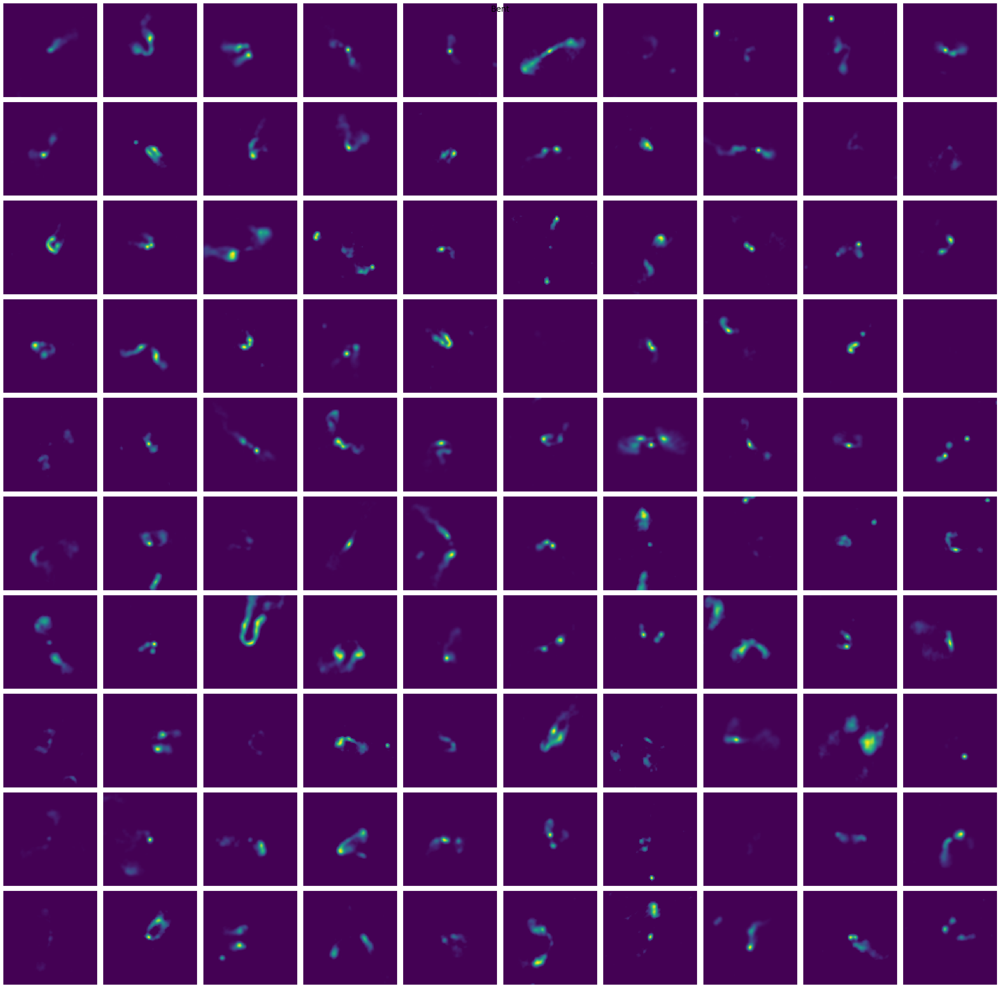

In [26]:
from torchvision.transforms import CenterCrop
from torch.utils.data import DataLoader
import numpy as np
from plotting.plot_images import plot_image_grid
from datasets.firstgalaxydata import label_to_class_dict
import matplotlib.pyplot as plt

lbl2cls = label_to_class_dict()

for label, cl in lbl2cls.items():
    images = [dataset[i][0] for i in np.argwhere(dataset.labels == label).squeeze()]

    # Random 100 images
    idxs = np.random.choice(len(images), 100, replace=False)
    images = np.array(images)[idxs]

    plot_image_grid(
        images, n_rows=10, vmin=0, vmax=1, suptitle=cl,
    )
    plt.show()

In [20]:
images[0].shape

(300, 300)

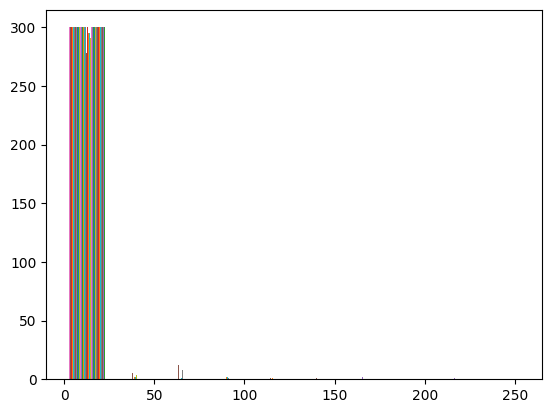

In [17]:
plt.hist(images[0])
plt.show()

In [ ]:
from torch.utils.data import DataLoader
from plotting.plot_images import plot_image_grid
import matplotlib.pyplot as plt

n_rows = n_cols = 10

# Pick a random sample from the dataset
dataloader = DataLoader(dataset, batch_size=n_rows*n_cols, shuffle=False)
for batch in dataloader:
    plot_image_grid(batch[0], n_rows=n_rows, n_cols=n_cols, vmin=0, vmax=1)
    plt.show()

In [ ]:
test_img = dataset[0][0]
test_img

### Plot Distributions

In [10]:
from analysis import image_metrics as imet
import analysis.model_evaluations as meval
reload(imet)
reload(meval)

# Calculate image metrics
img_metrics = meval.metrics_dict_from_data(dataset, n_bins=4)
distr = meval.distributions_from_metrics(img_metrics)

Calculating metrics...


100%|██████████| 2155/2155 [00:04<00:00, 475.22it/s]


Calculating metric distributions...


100%|██████████| 12/12 [00:00<00:00, 3659.95it/s]


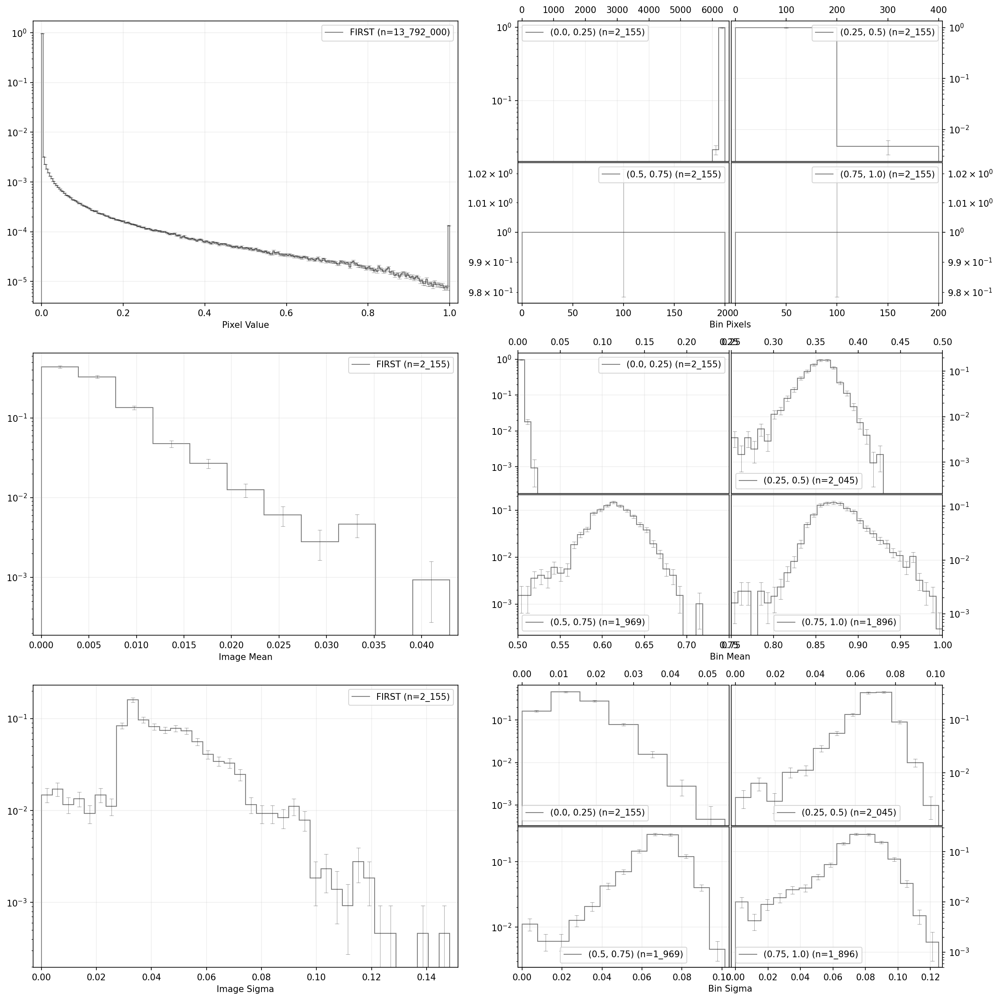

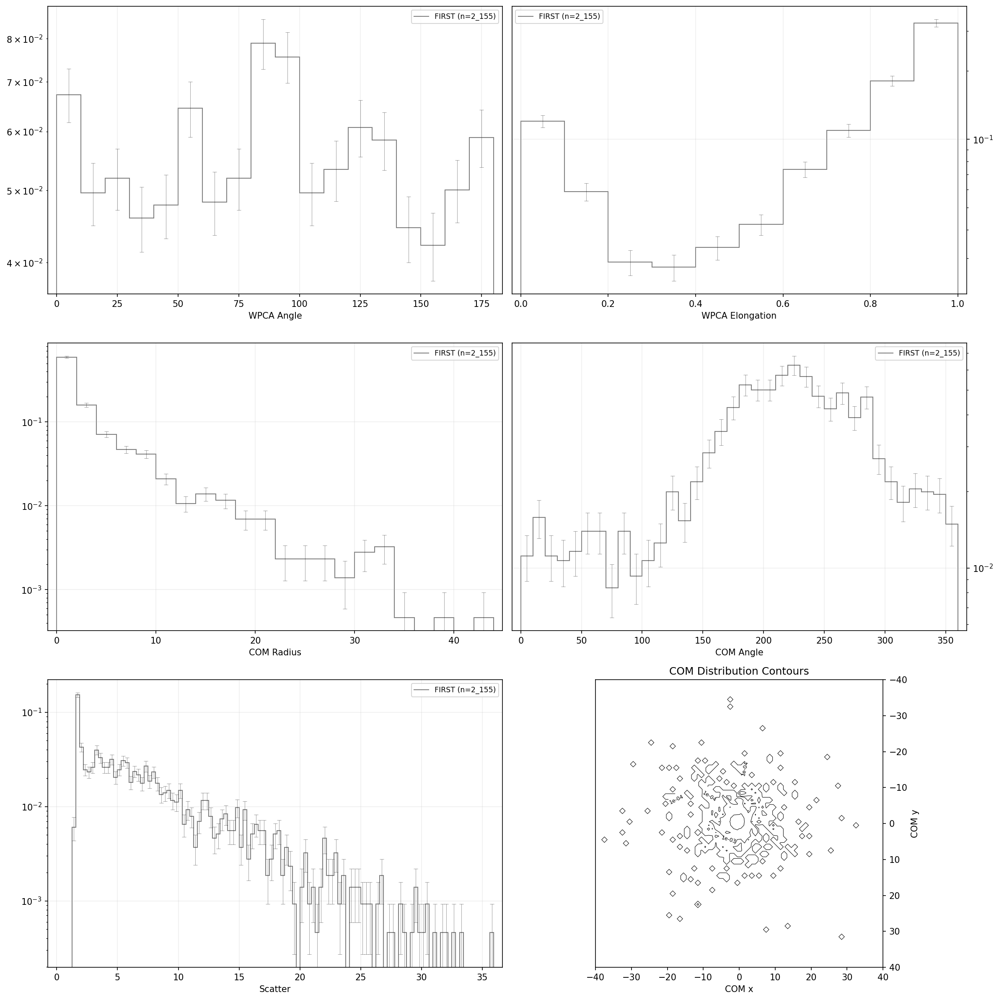

In [11]:
import plotting.plot_metrics as putil

putil.metrics_plots(distr, labels='FIRST');

In [ ]:
FIRST_distr = meval.distributions_from_metrics(FIRST_metrics)

In [ ]:
import plotting.plot_utils
reload(plotting.plot_utils)
from plotting.plot_metrics import metrics_plots

plots = metrics_plots(FIRST_distr, labels="FIRST", colors='darkorange')

In [9]:
# Calculate distributions separately for every class
dataset.selected_classes
classes = ['FRI', 'FRII', 'Compact', 'Bent']

distributions = []
for cls in classes:
    print(f"\n\nCalculating metrics for class {cls}...")
    cls_dset = FIRSTGalaxyData(
        selected_split=['test', 'train', 'valid'],
        selected_classes=[cls],
        transform=eval_transform(80),
    )
    cls_metrics = meval.metrics_dict_from_data(cls_dset)
    cls_distr = meval.distributions_from_metrics(cls_metrics)
    distributions.append(cls_distr)
    



Calculating metrics for class FRI...


/home/bbd0953/diffusion/src/datasets/firstgalaxydata.py:350: UserWarning: Could not find masking parameters, only available for LOFAR data. mask_param will be None.
  warnings.warn(


Removing images where all pixels are zero after transform...
	Removed 0 images.
Calculating metrics...


100%|██████████| 495/495 [00:01<00:00, 427.72it/s]


Calculating metric distributions...


100%|██████████| 12/12 [00:00<00:00, 5836.91it/s]
/home/bbd0953/diffusion/src/datasets/firstgalaxydata.py:350: UserWarning: Could not find masking parameters, only available for LOFAR data. mask_param will be None.
  warnings.warn(




Calculating metrics for class FRII...
Removing images where all pixels are zero after transform...
	Removed 1 images.
Calculating metrics...


100%|██████████| 923/923 [00:02<00:00, 453.77it/s]


Calculating metric distributions...


100%|██████████| 12/12 [00:00<00:00, 6206.89it/s]
/home/bbd0953/diffusion/src/datasets/firstgalaxydata.py:350: UserWarning: Could not find masking parameters, only available for LOFAR data. mask_param will be None.
  warnings.warn(




Calculating metrics for class Compact...
Removing images where all pixels are zero after transform...
	Removed 0 images.
Calculating metrics...


100%|██████████| 391/391 [00:00<00:00, 428.19it/s]


Calculating metric distributions...


100%|██████████| 12/12 [00:00<00:00, 6389.70it/s]
/home/bbd0953/diffusion/src/datasets/firstgalaxydata.py:350: UserWarning: Could not find masking parameters, only available for LOFAR data. mask_param will be None.
  warnings.warn(




Calculating metrics for class Bent...
Removing images where all pixels are zero after transform...
	Removed 2 images.
Calculating metrics...


100%|██████████| 346/346 [00:00<00:00, 427.52it/s]


Calculating metric distributions...


100%|██████████| 12/12 [00:00<00:00, 8780.82it/s]


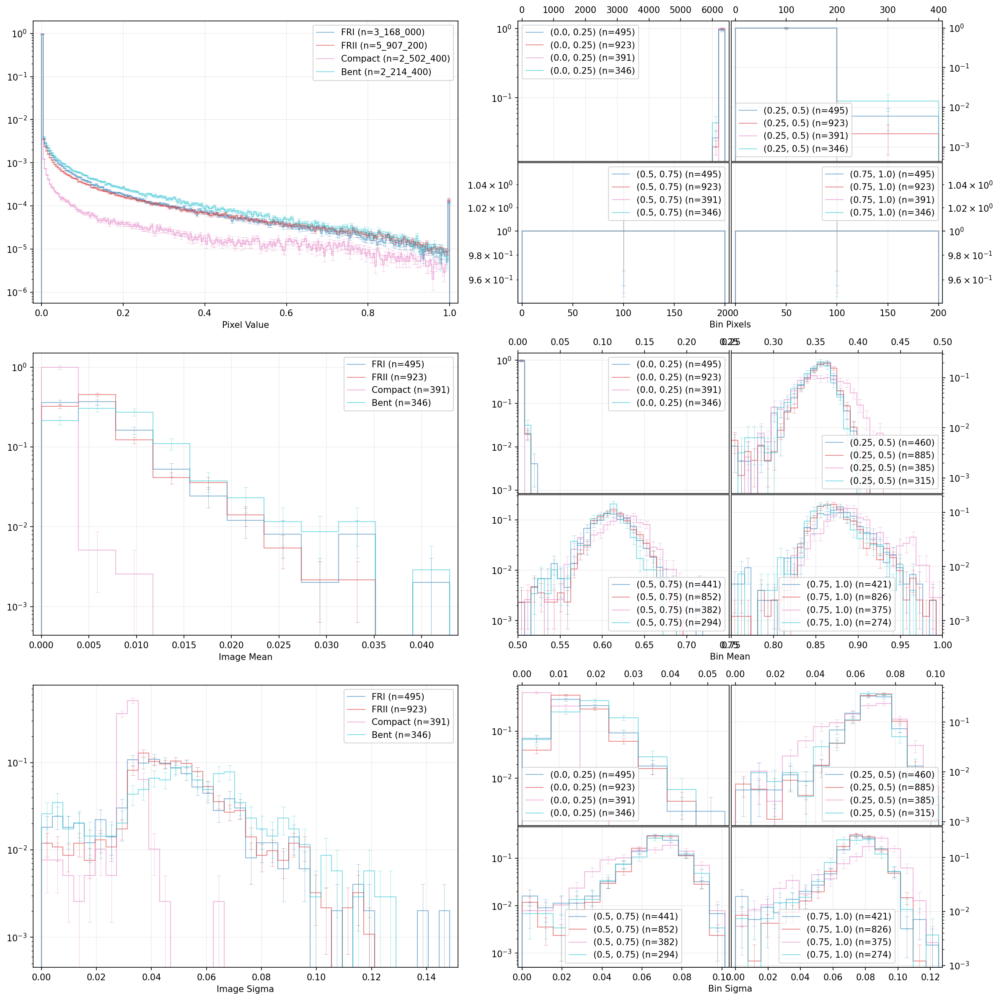

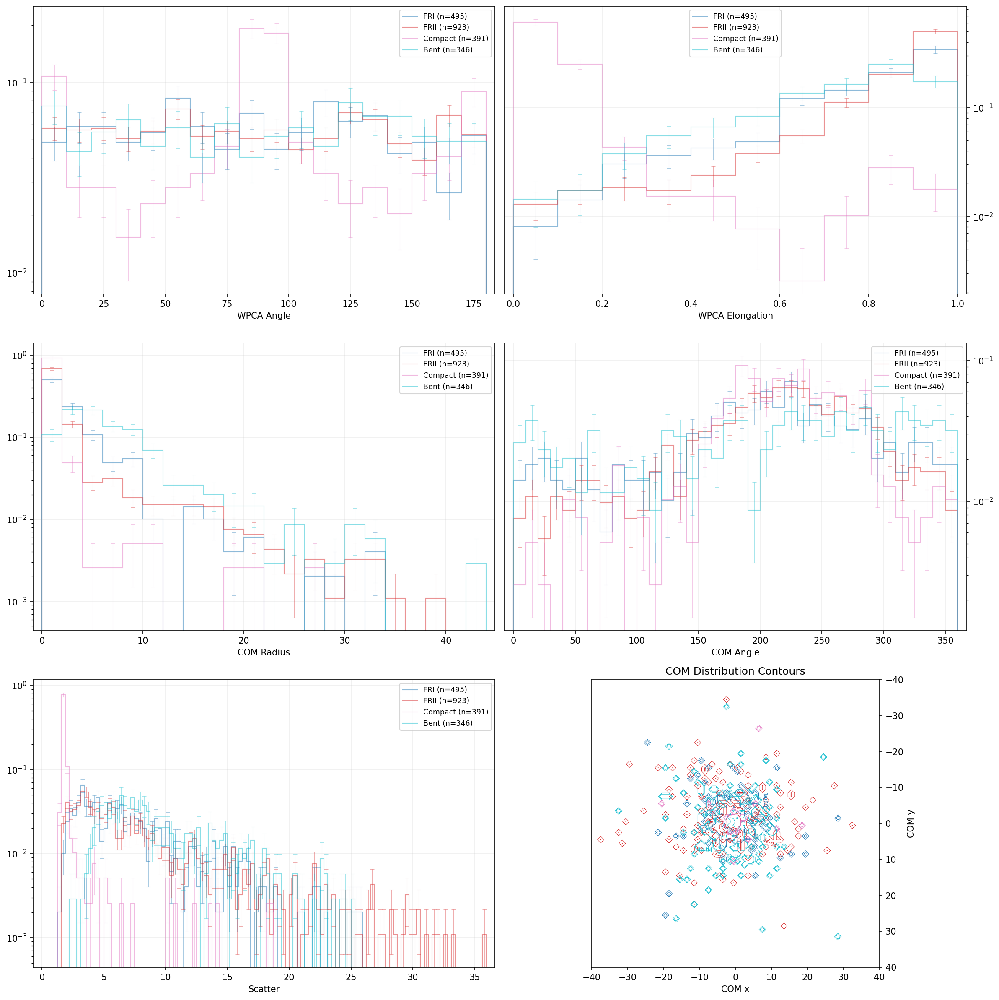

In [10]:
import plotting.plot_utils
reload(plotting.plot_utils)
from plotting.plot_metrics import metrics_plots

plots = metrics_plots(distributions, labels=classes, cmap='tab10')

In [11]:
from utils.paths import ANALYSIS_PARENT

out_folder = ANALYSIS_PARENT / 'FIRST'
out_folder.mkdir(exist_ok=True)

In [13]:
# Save plots
names = ['FIRST_pixel_metrics_plot', 'FIRST_shape_metrics_plot']

for plot, name in zip(plots, names):
    plot[0].savefig(out_folder / f'{name}.pdf')

In [18]:
# Save distributions
import numpy as np
for cls, distr in zip(classes, distributions):
    np.save(out_folder / f'FIRST_{cls}_metrics.npy', distr)

### Look at H5 files

In [ ]:
import h5py
import numpy as np

file = '/home/bbd0953/diffusion/image_data/FIRST/galaxy_data_h5.h5'

with h5py.File(file, 'r') as f:
    print([i for i in f.attrs.items()])
    for k, v in f['data_0']['Img'].attrs.items():
        print(f'{k}: {v}')


### Make Catalog

In [ ]:
import h5py
import numpy as np
from tqdm import tqdm
import pandas as pd
from pathlib import Path

file = Path('/home/bbd0953/diffusion/image_data/FIRST/galaxy_data_h5.h5')

keys_data = ['Label_CDL1', 'Label_literature']
keys_img = ['RA', 'DEC',]

catalog_dict = {
    key: [] for key in ['Source_Name', 'FGD_Key'] + keys_data + keys_img
}

with h5py.File(file, 'r') as f:
    for key, entry in tqdm(f.items()):
        # Source identifiers
        catalog_dict['FGD_Key'].append(key)
        catalog_dict['Source_Name'].append(
            entry['Img'].attrs['coord_str'].replace('.png', '')
        )
        
        # Labels
        for k in keys_data:
            catalog_dict[k].append(entry[k][()].astype(np.uint8))

        # Coords
        for k in keys_img:
            catalog_dict[k].append(entry['Img'].attrs[k])

catalog_df = pd.DataFrame(catalog_dict)
catalog_df.to_csv(file.parent / f'catalog_{file.stem}.csv', index=False)


## Distributions of Train Data Subsets

In [4]:
import analysis.model_evaluations as meval
import utils.paths as paths
import plotting.plot_utils as plot_utils

### 0-Clipped, SNR>=5, 120as Limit:

Loading images...
Data set initialized.


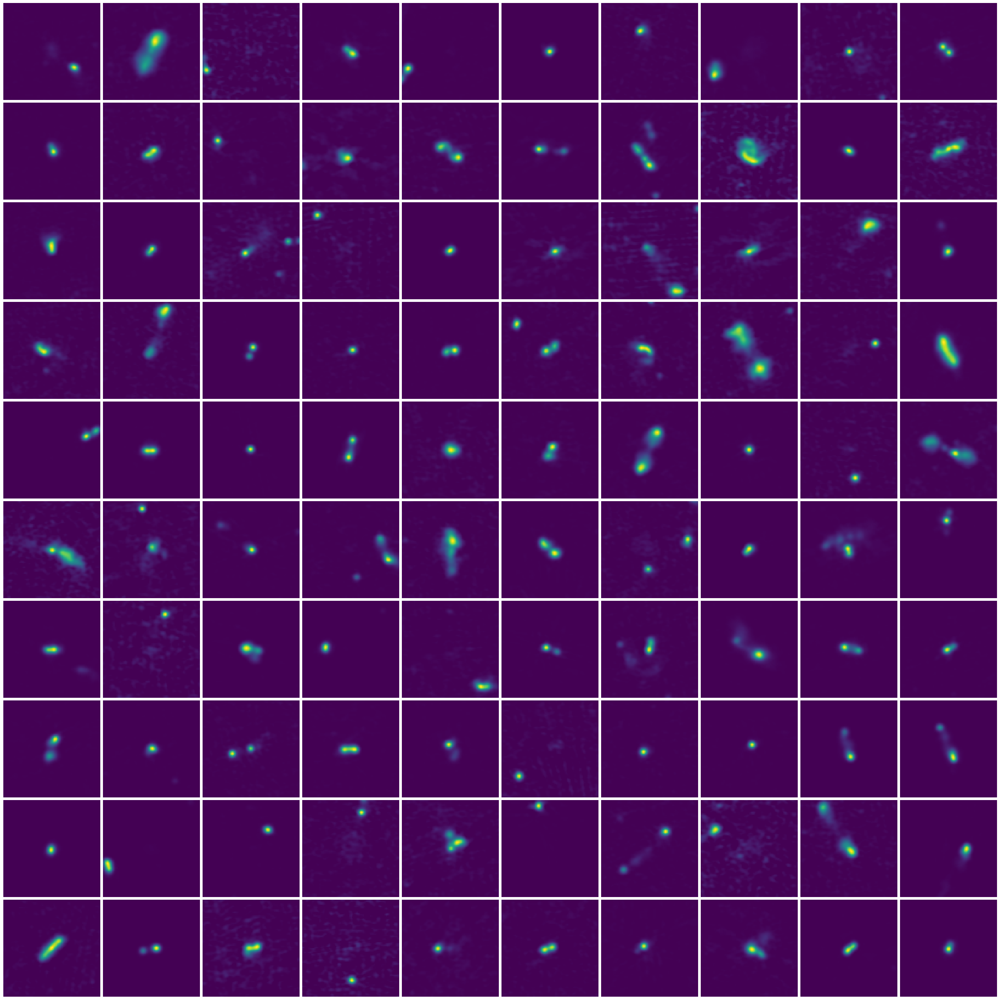

In [16]:
import utils.data_utils
reload(utils.data_utils)
from utils.data_utils import plotting.plot_imagesTrainDataset
import numpy as np

dataset = TrainDataset(paths.LOFAR_SUBSETS['0-clip_unscaled'])

n = 10
idxs = np.random.choice(len(dataset), n**2, replace=False)
plot_utils.plot_image_grid([dataset[i] for i in idxs], n_rows=n, vmin=-1, );

In [13]:
dataset[0].shape

torch.Size([1, 80, 80])

### Unclipped, SNR>=5, 120as Limit:

Loading images...


Data set initialized.


(<Figure size 2400x2400 with 64 Axes>,
 array([[<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
         <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
         <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
         <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
         <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
         <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
         <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
         <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
         <Axes: >, <Axes: >]], dtype=object))

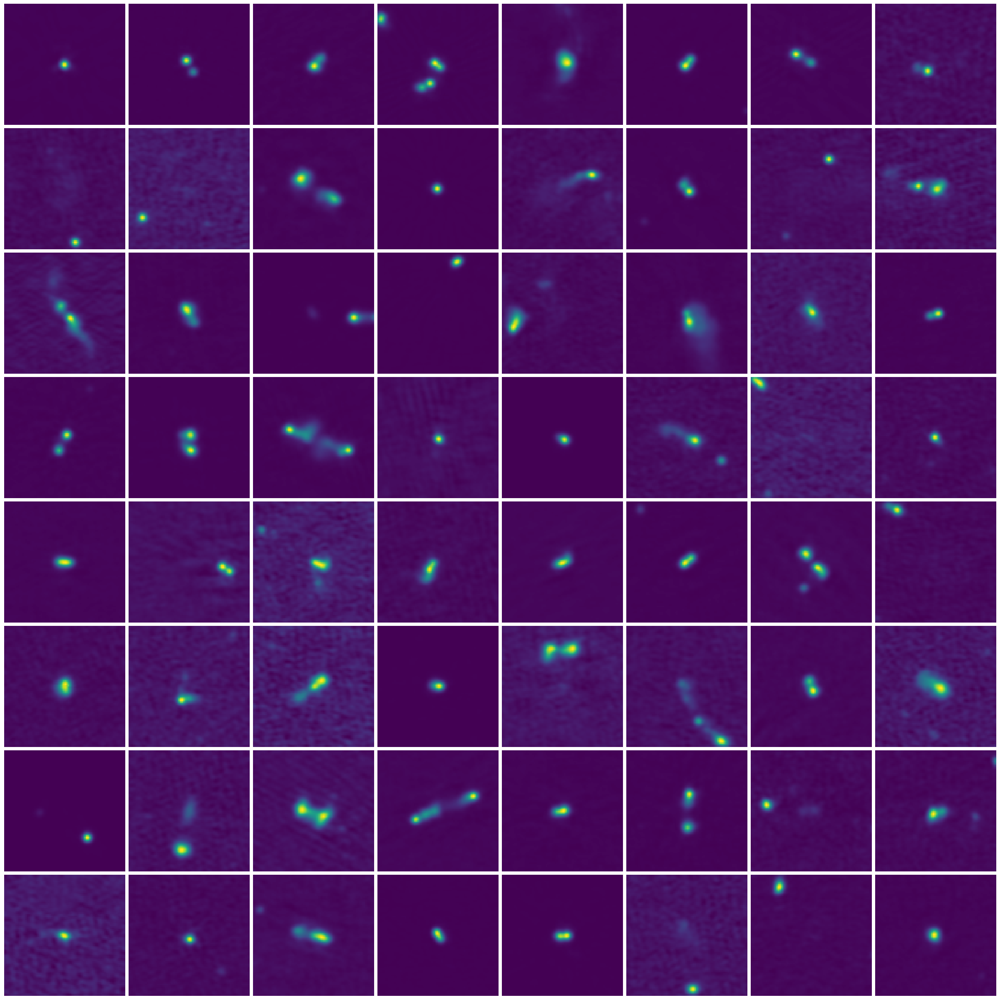

In [6]:
from utils.data_utils import EvaluationDataset
import numpy as np

dataset = Eplotting.plot_imagesths.LOFAR_SUBSETS['120asLimit_SNR>=5'])

n = 8
idxs = np.random.choice(len(dataset), n**2, replace=False)
plot_utils.plot_image_grid(dataset.data[idxs], n_rows=n, vmin=0, )

### Unclipped, SNR>=5, 50as Limit:

/home/bbd0953/diffusion/src/analysis/model_evaluations.py:231: UserWarning: Multiple image directories passed to metrics plot, therefore save_fig is set to False.
  warnings.warn(


Loading images...
Data set initialized.
Calculating metrics...


100%|██████████| 68976/68976 [02:41<00:00, 425.95it/s]


Calculating metric distributions...


100%|██████████| 12/12 [00:00<00:00, 115.85it/s]


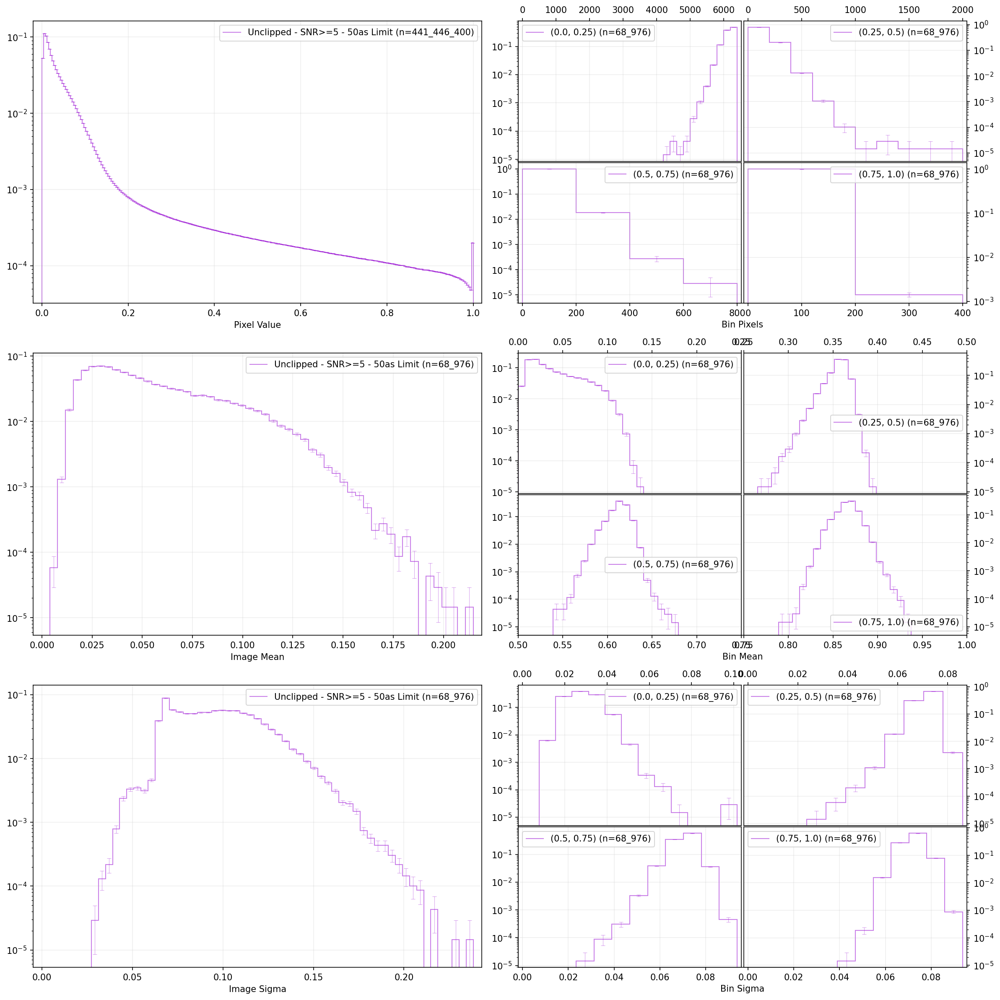

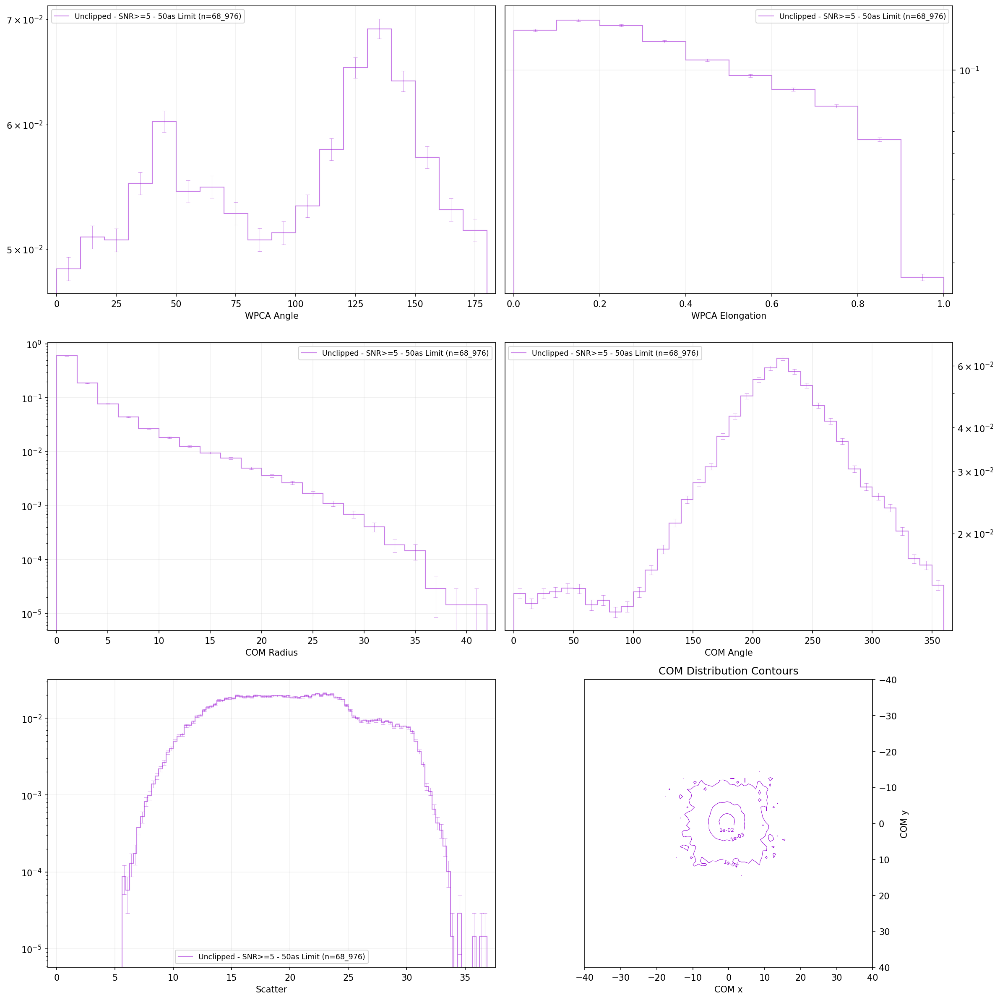

In [17]:
reload(paths)

figs = meval.get_metrics_plots(
    [],
    train_path=paths.LOFAR_SUBSETS['unclipped_SNR>=5_50asLimit'],
    train_label='Unclipped - SNR>=5 - 50as Limit',
)

### Unclipped, SNR>=3:

Loading images...
Data set initialized.
Calculating metrics...


  0%|          | 229/106663 [00:00<04:20, 409.12it/s]

100%|██████████| 106663/106663 [03:59<00:00, 446.06it/s]


Calculating metric distributions...


100%|██████████| 12/12 [00:00<00:00, 82.22it/s]


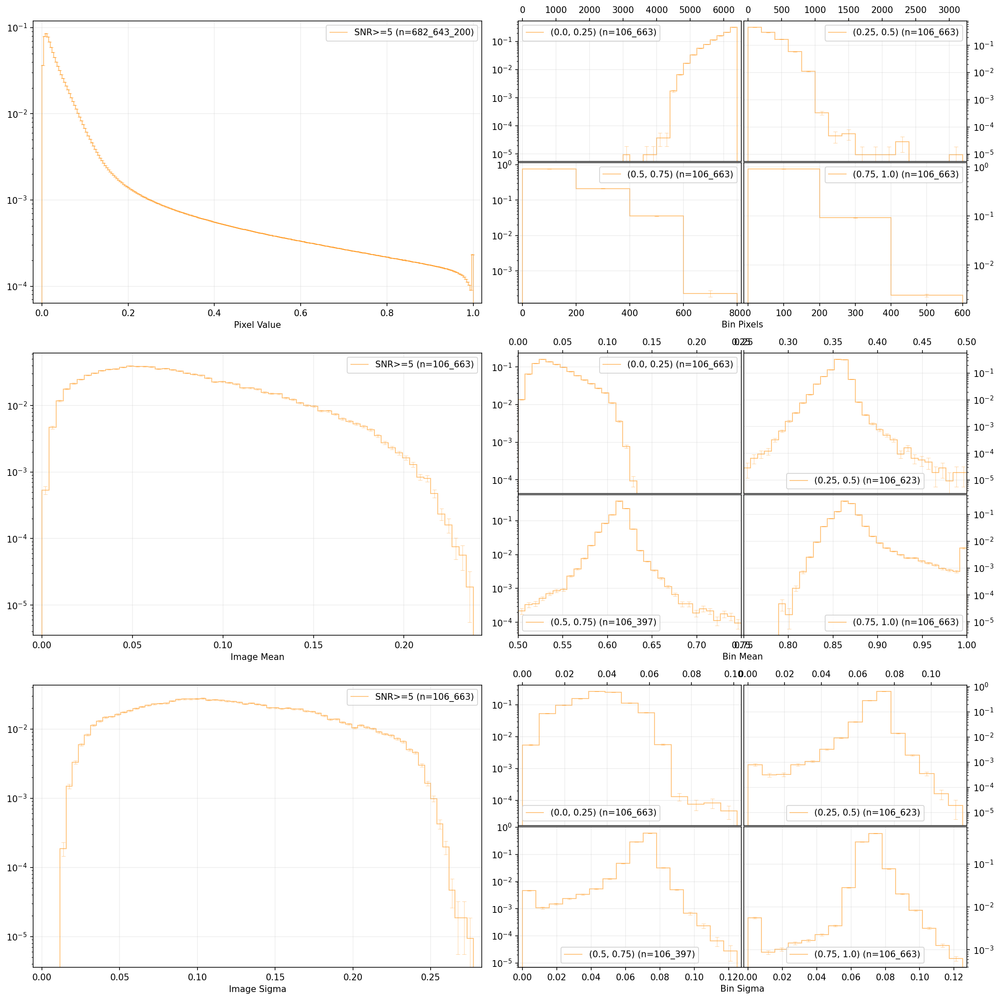

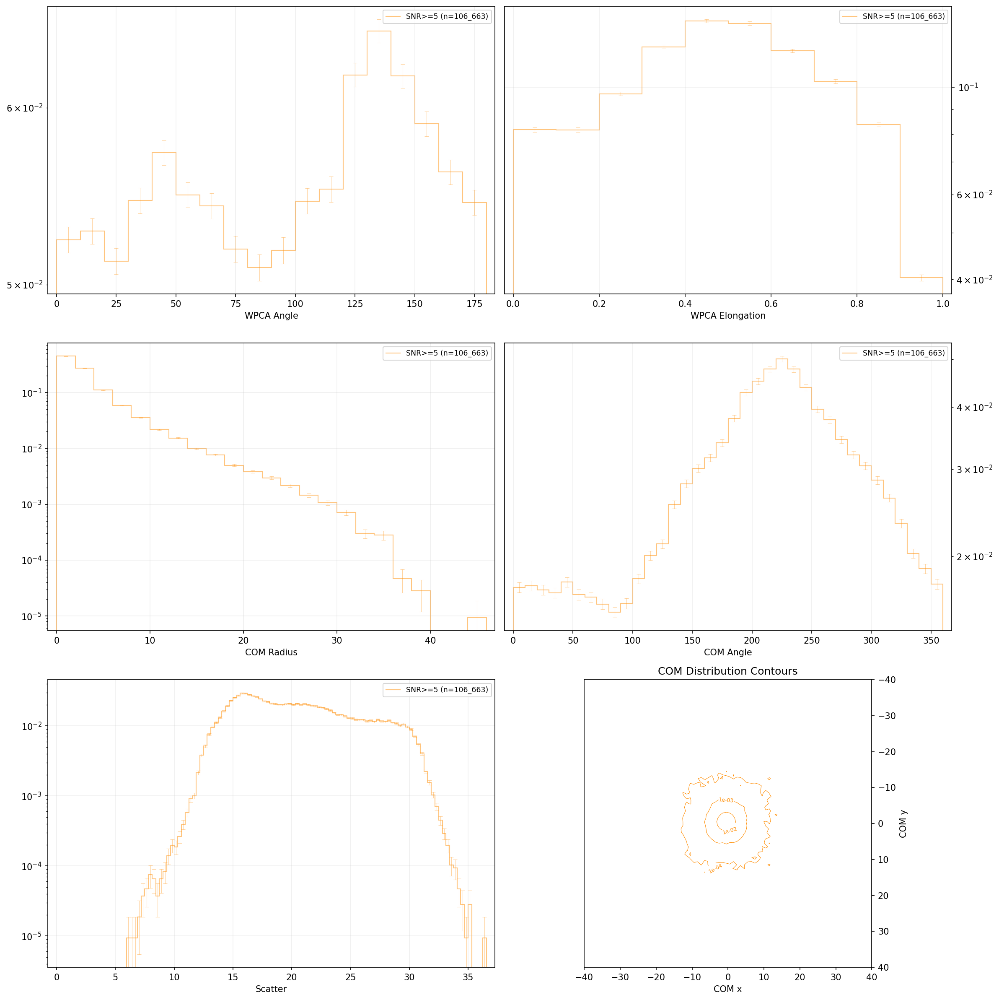

In [6]:
reload(paths)

figs = meval.get_metrics_plots(
    [],
    train_path=paths.LOFAR_SUBSETS['unclipped_SNR>=5'],
    train_label='SNR>=5',
)

### 1 Sigma Clipped:

/home/bbd0953/diffusion/src/analysis/model_evaluations.py:230: UserWarning: Multiple image directories passed to metrics plot, therefore save_fig is set to False.
  warnings.warn(


Loading images...
Data set initialized.
Calculating metrics...


100%|██████████| 132872/132872 [04:31<00:00, 490.03it/s]


Calculating metric distributions...


100%|██████████| 12/12 [00:00<00:00, 66.00it/s]


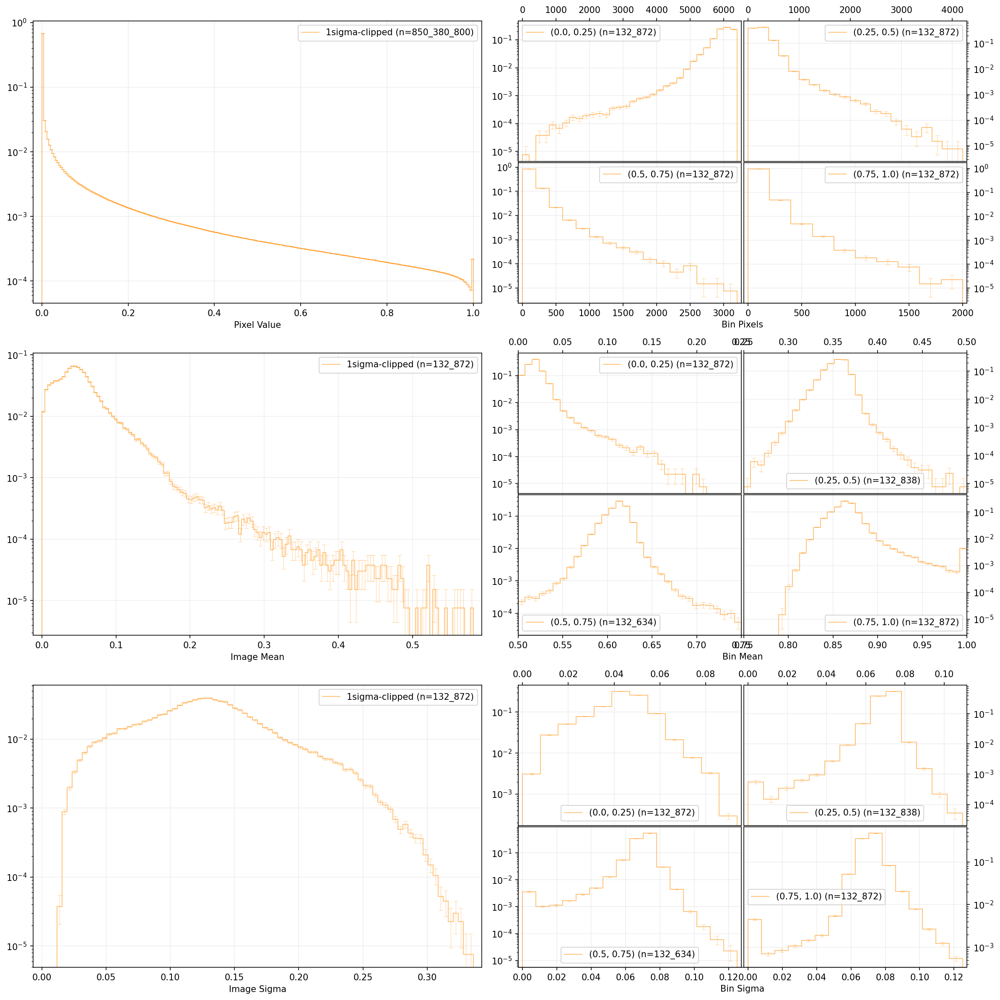

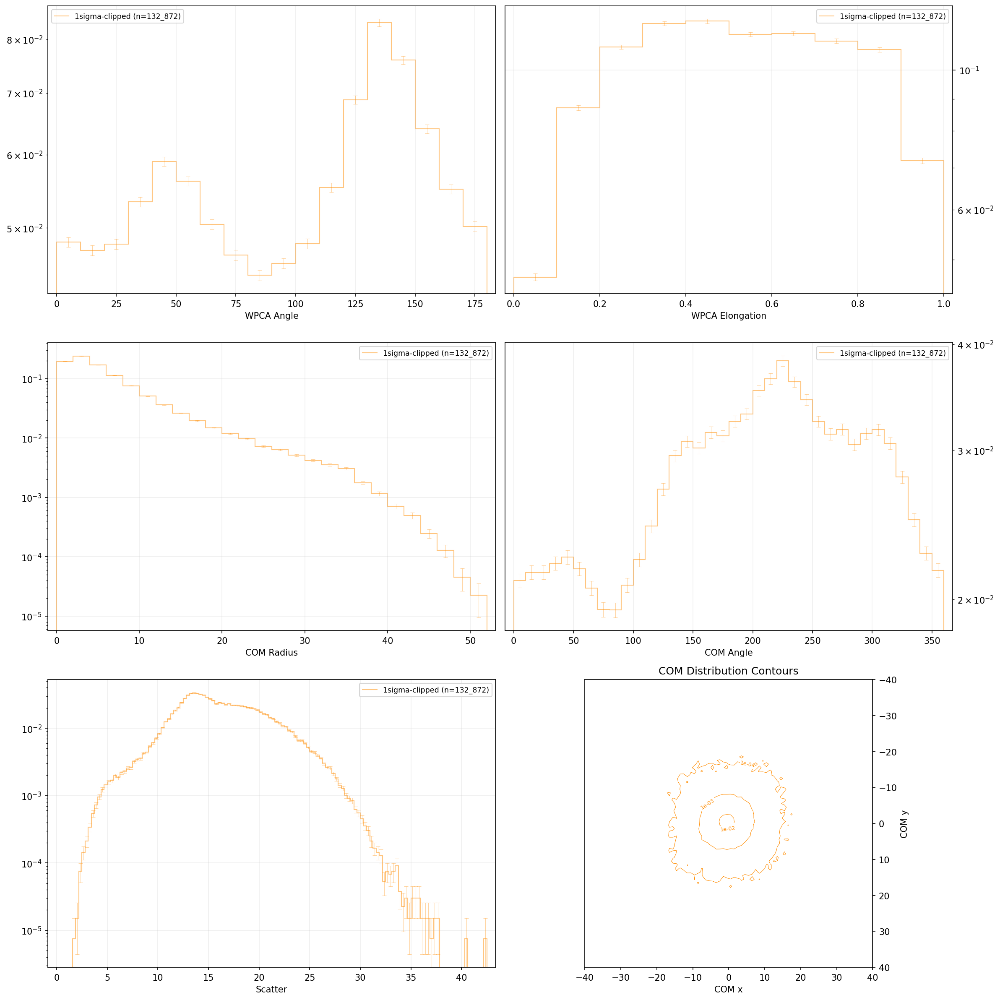

In [3]:
figs = meval.get_metrics_plots(
    [],
    train_path=paths.LOFAR_SUBSETS['1sigma-clipped'],
    train_label='1sigma-clipped',
)

In [4]:
import h5py
import numpy as np

with h5py.File(paths.LOFAR_SUBSETS['1sigma-clipped'], 'r') as f:
    images = np.array(f['images'])

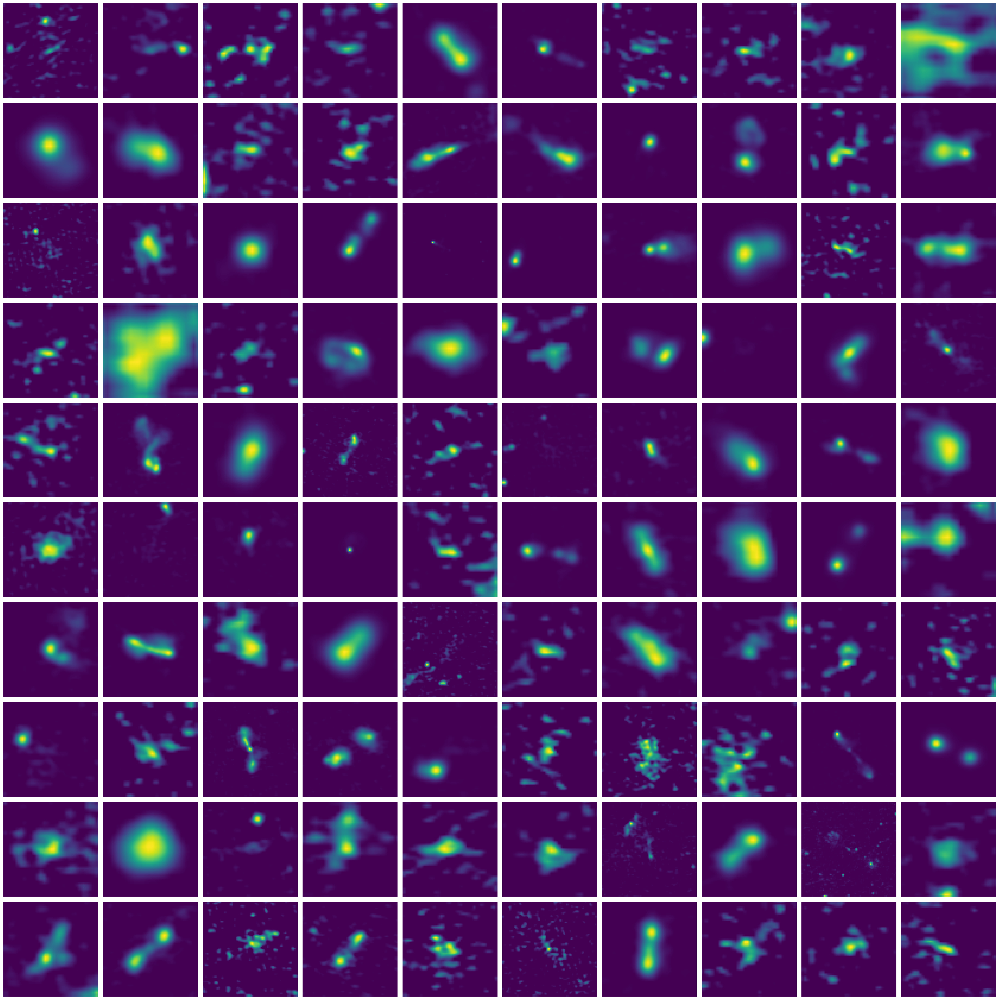

In [8]:
from plotting import plot_images as putil

n = 10

# Pick n**2 random images
idxs = np.random.choice(len(images), n**2, replace=False)
images = images[idxs]

putil.plot_image_grid(images, vmin=0);

### Unclipped, Image-minmax:

/home/bbd0953/diffusion/src/analysis/model_evaluations.py:231: UserWarning: Multiple image directories passed to metrics plot, therefore save_fig is set to False.
  warnings.warn(


Loading images...
Data set initialized.
Calculating metrics...


100%|██████████| 132872/132872 [04:56<00:00, 448.41it/s]


Calculating metric distributions...


100%|██████████| 12/12 [00:00<00:00, 68.68it/s]


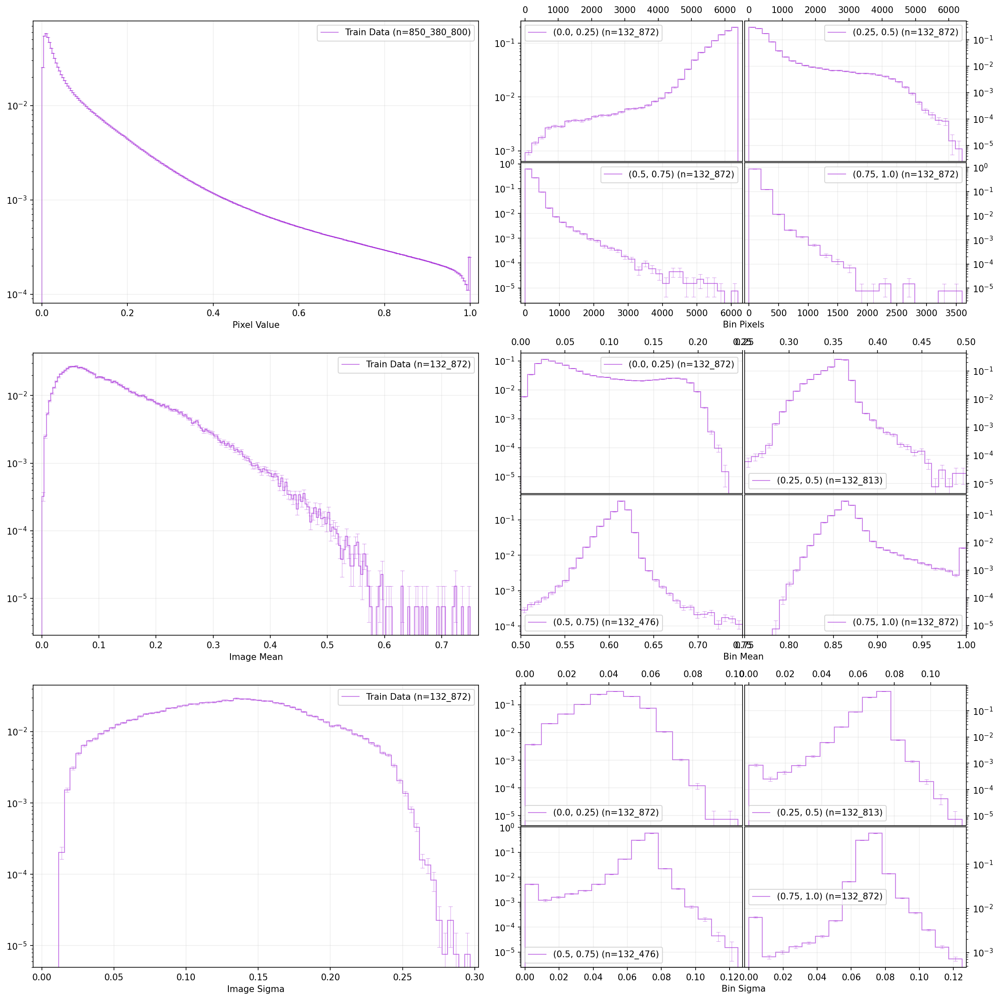

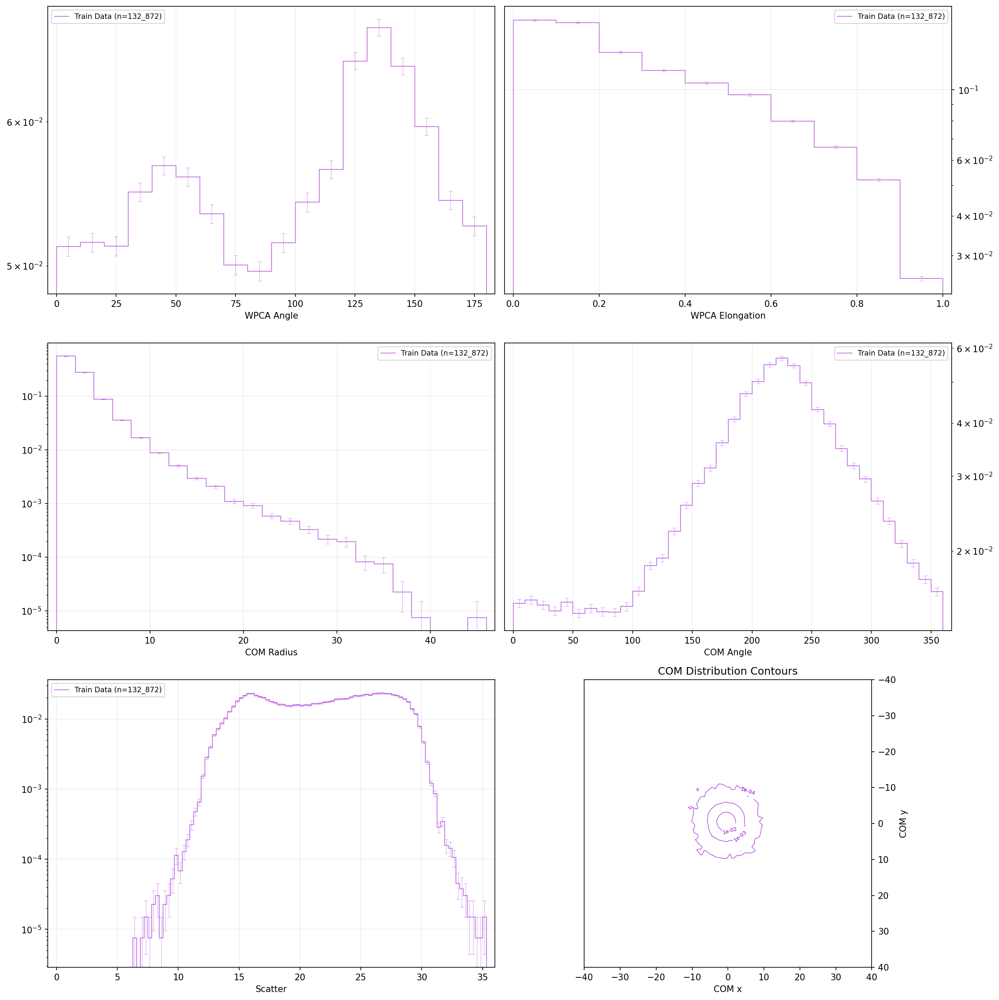

In [2]:
from utils.paths import LOFAR_SUBSETS
from importlib import reload
import analysis.image_metrics as imet
import analysis.model_evaluations as meval
reload(imet)
reload(meval)

path = LOFAR_SUBSETS['unclipped_H5']

# metrics = meval.metrics_dict_from_data(path, n_bins=1)

meval.get_metrics_plots(
    [],
    train_path=path,
    force_train=True,
);

In [10]:
from utils.data_utils import EvaluationDataset

dset = EvaluationDataset(path)

Loading images...
Data set initialized.


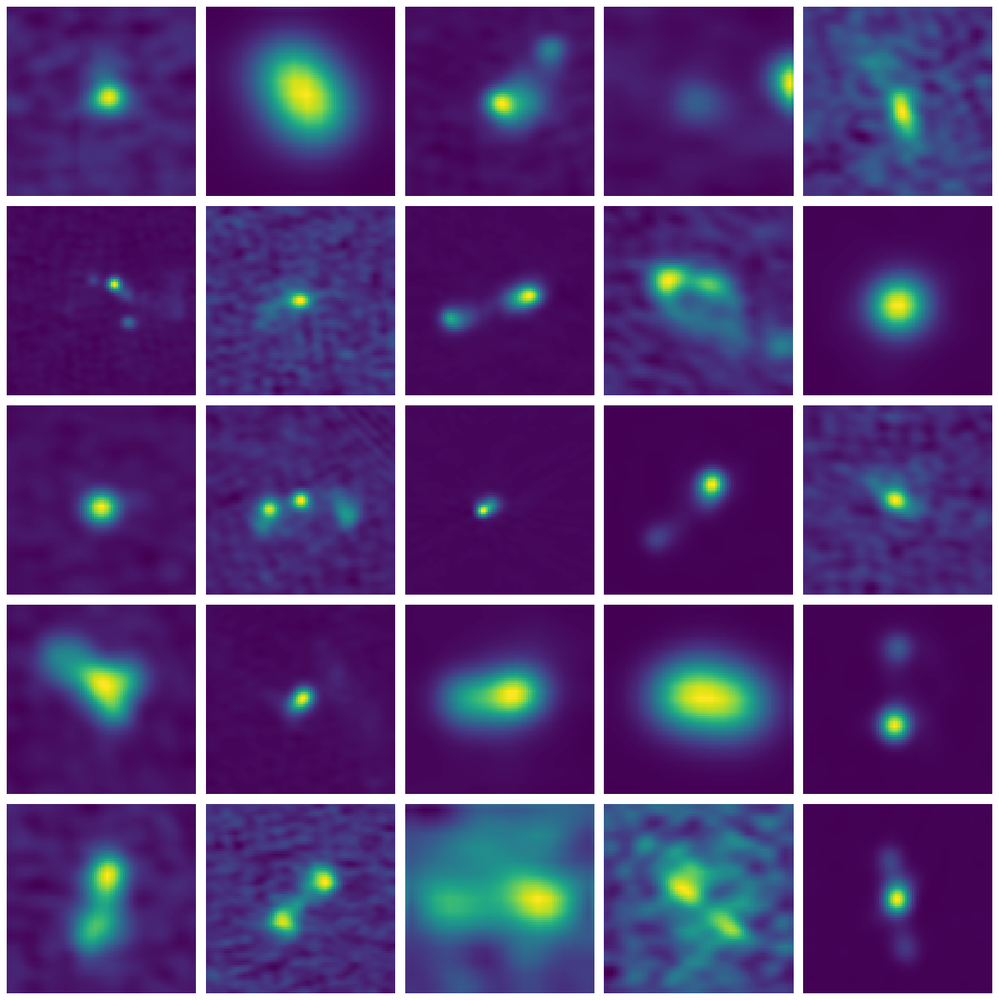

In [14]:
from plotting.plot_images import plot_image_grid
import numpy as np

n = 5

# Pick n**2 random images
idxs = np.random.choice(len(dset), n**2, replace=False)

plot_image_grid(dset.data[idxs], vmin=0);

(100, 100)


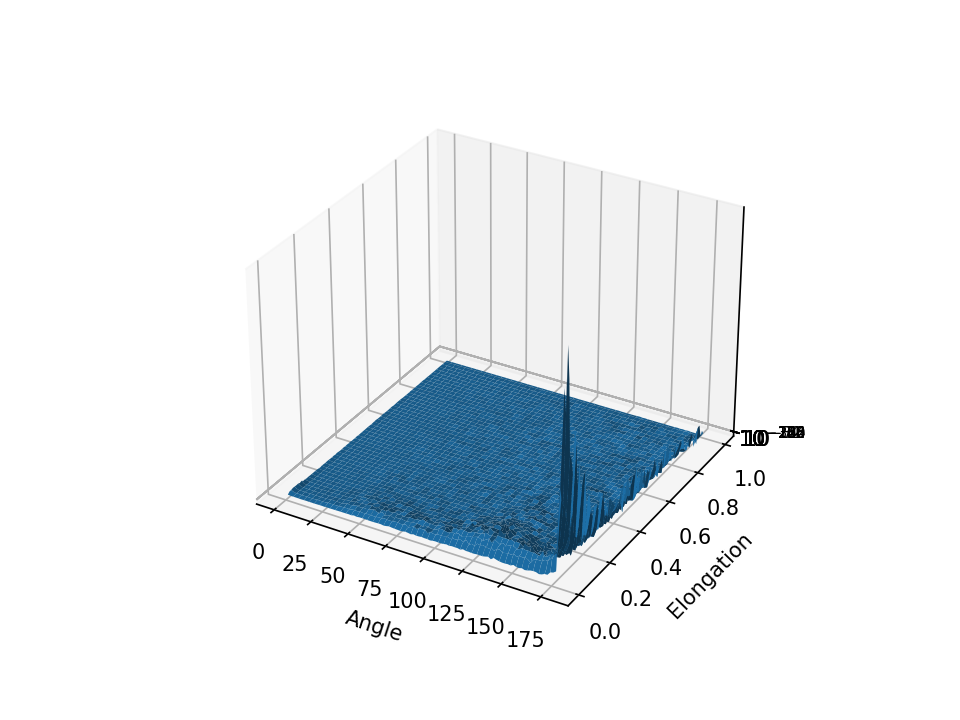

In [41]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

angles = metrics['WPCA_Angle']
elongations = metrics['WPCA_Elongation']

# 2d historgram, normalized over elongation axis
counts, ex, ey = np.histogram2d(angles, elongations, bins=100)
counts = counts.T
counts /= counts.sum(axis=1)

def centers(edges):
    return (edges[:-1] + edges[1:]) / 2

print(counts.shape)

fig, ax = plt.subplots(dpi=150, subplot_kw={"projection": "3d"})

# Plot the surface
x, y = np.meshgrid(centers(ex), centers(ey))
c = ax.plot_surface(
    x, y, counts
)
ax.set_xlabel('Angle')
ax.set_ylabel('Elongation')
ax.set_zscale('log')

%matplotlib widget

plt.show()

In [47]:
min(angles)

0.004209526948136074

(100, 100)


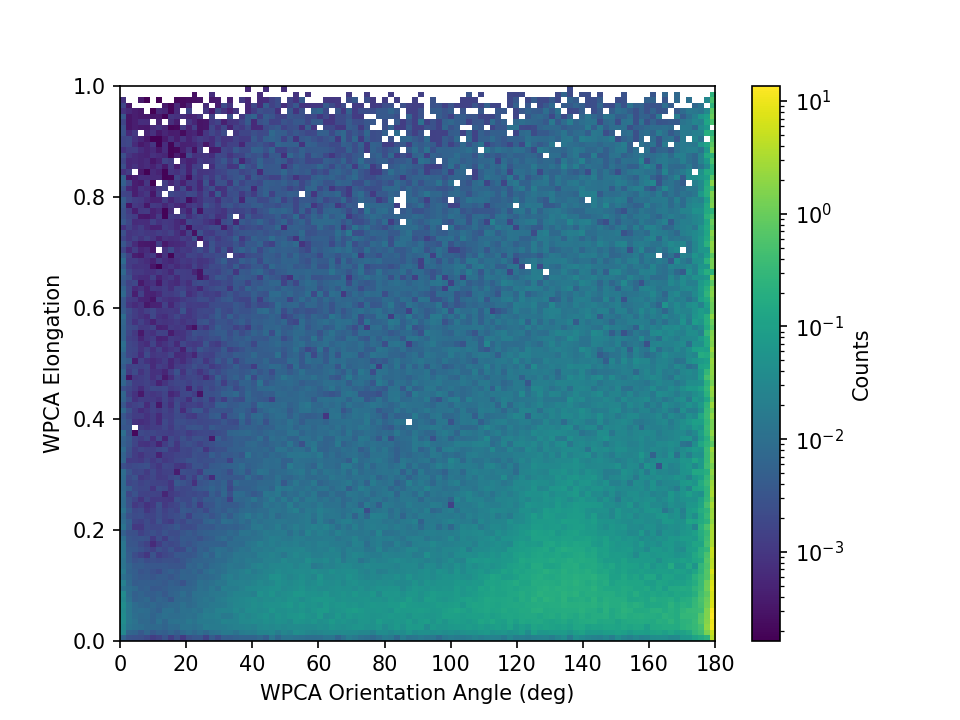

In [45]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

angles = metrics['WPCA_Angle']
elongations = metrics['WPCA_Elongation']

# 2d historgram, normalized over elongation axis
counts, ex, ey = np.histogram2d(
    angles, elongations,
    bins=(np.linspace(0, 180, 101), np.linspace(0, 1, 101))
)
counts = counts.T
counts /= counts.sum(axis=1)

print(counts.shape)

fig, ax = plt.subplots(dpi=150)

im = ax.imshow(
    counts,
    extent=(ex[0], ex[-1], ey[0], ey[-1]),
    norm=mpl.colors.LogNorm(),
    aspect='auto',
    origin='lower',
)
fig.colorbar(im, ax=ax, label='Counts')
ax.set_xlabel('WPCA Orientation Angle (deg)')
ax.set_ylabel('WPCA Elongation')
plt.show()

### Zero-clipped Subset:

In [ ]:
import plotting.plot_metrics


distr_dict = meval.get_distributions(
    plot_function(distr_dict, color='darkorange', label='LOFAR')
    for plot_function in [plotting.plot_metrics.pixel_metrics_plot, plotting.plot_metrics.shape_metrics_plot]
]

pixel[0].show()
shape[0].show()

### Unclipped, absolute value, subset-scaled:

In [ ]:
import h5py
import numpy as np

p = Path(
    '/home/bbd0953/diffusion/image_data/LOFAR/lofar_zoom_unclipped_subset_80p_abs_subset-norm.hdf5'
)

In [ ]:
import analysis.model_evaluations as meval

meval.get_metrics_plots(
    p, labels=['80p_uncl_abs_subset-norm'], force=False
);

### Zero-clipped, absolute value, normalized over dataset, then create subset:

Load images from subset file

In [ ]:
import h5py
import numpy as np

p = Path(
    '/home/bbd0953/diffusion/image_data/LOFAR/lofar_zoom_unclipped_subset_80p_abs_dset-norm.hdf5'
)

with h5py.File(p, 'r') as f:
    # Print all keys
    images = np.array(f['images'])
    names = np.array(f['names'].asstr())

Look at pixel distribution

In [ ]:
import matplotlib.pyplot as plt
plt.hist(images.flatten(), bins=256)
plt.yscale('log')

Load processed cutouts pre-norm

In [ ]:
p_cut = Path(
    '/home/bbd0953/diffusion/image_data/LOFAR/cutouts/cutouts-1p5las-TrueoptCoords_processed_abs_dset-norm.hdf5'
)

with h5py.File(p_cut, 'r') as f:
    images_cut = np.array(f['images_clipped'])
    names_cut = np.array(f['images_clipped_names'].asstr())

    images_resized = np.array(f['images_resized'])
    names_resized = np.array(f['images_resized_names'].asstr())

In [ ]:
# Create a dictionary from names_resized where the keys are the names and the values are the indices
indices_dict = {name: i for i, name in enumerate(names_resized)}

# Find the set difference
set_diff = set(names_resized) - set(names)

# Use the dictionary to index into images_resized
images_diff = [images_resized[indices_dict[name]] for name in set_diff]
images_subset = [images_resized[indices_dict[name]] for name in names]

In [ ]:
len(images_diff), len(images_subset)

In [ ]:
import matplotlib.pyplot as plt
from utils.stats_utils import norm

c_cut, b_cut = np.histogram(np.abs(images_resized).flatten(), bins=128)
c_diff, _ = np.histogram(np.abs(images_diff).flatten(), bins=b_cut)
c_sub, _ = np.histogram(np.abs(images_subset).flatten(), bins=b_cut)

In [ ]:
fig, ax = plt.subplots()

labels = [
    'from cutouts', 'removed (Peak_flux <= 0.75)', 'filtered (Peak_flux > 0.75)'
]

for c, label in zip([c_cut, c_diff, c_sub], labels):
    ax.stairs(norm(c), b_cut, fill=False, label=label, alpha=0.5)
ax.set_yscale('log')
ax.legend()
ax.set_xlabel('Pixel Value')
ax.set_ylabel('Frequency (over dataset)')
fig.show()

Load catalog:


In [ ]:
import pandas as pd

CATALOG_FILE = '/home/bbd0953/RadioGalaxyImage/image_data/LOFAR/6-LoTSS_DR2-public-resolved_sources.csv'

catalog = pd.read_csv(CATALOG_FILE)

In [ ]:
# Print all column names in df
print(catalog.columns)

In [ ]:
catalog_cut = catalog[catalog['Source_Name'].isin(names_cut)]
catalog_resized = catalog[catalog['Source_Name'].isin(names_resized)]

In [ ]:
cut_means = np.array([np.abs(a).mean() for a in images_cut])

In [ ]:
plt.scatter(catalog_cut['Peak_flux'], [np.abs(a).mean() for a in images_cut],
            s=0.05, alpha=0.3, label='From cutouts (before resize)',
            c=catalog_cut['LAS'])
'''
plt.scatter(catalog_resized['Peak_flux'], np.abs(images_resized).mean(axis=(1, 2)),
            s=0.05, alpha=0.3, label='From cutouts (after resize)')
'''

# Vertical line at 0.75
plt.axvline(0.75, color='k', linestyle='--', alpha=0.5, label='Peak_flux = 0.75')

plt.xlabel('Peak Flux')
plt.ylabel('Mean Image Pixel Value')

plt.xscale('log')
plt.yscale('log')

plt.legend()

In [ ]:
plt.scatter(catalog_cut['Peak_flux'], catalog_cut['LAS'],
            s=0.05, alpha=0.3, label='From cutouts (before resize)')
'''
plt.scatter(catalog_resized['Peak_flux'], np.abs(images_resized).mean(axis=(1, 2)),
            s=0.05, alpha=0.3, label='From cutouts (after resize)')
'''

# Vertical line at 0.75
plt.axvline(0.75, color='k', linestyle='--', alpha=0.5, label='Peak_flux = 0.75')

plt.xlabel('Peak Flux')
plt.ylabel('LAS')

plt.xscale('log')
plt.yscale('log')

plt.legend()

In [ ]:
plt.hist(catalog['Peak_flux'], bins=128)
plt.yscale('log')

## Metric Peeks

In [3]:
from utils import paths
from utils.data_utils import EvaluationDataset, TrainDataset

dataset = TrainDataset(paths.LOFAR_SUBSETS['0-clip_unscaled'])

Loading images...
Data set initialized.


In [4]:
dataset.transform_max_vals()
mx_tr = dataset.max_values_tr
mx_tr.max(), mx_tr.min()

Max values transformed with Box-Cox transformation ([-0.22659119]).


(2.9294003785570264, -2.7917767738151635)

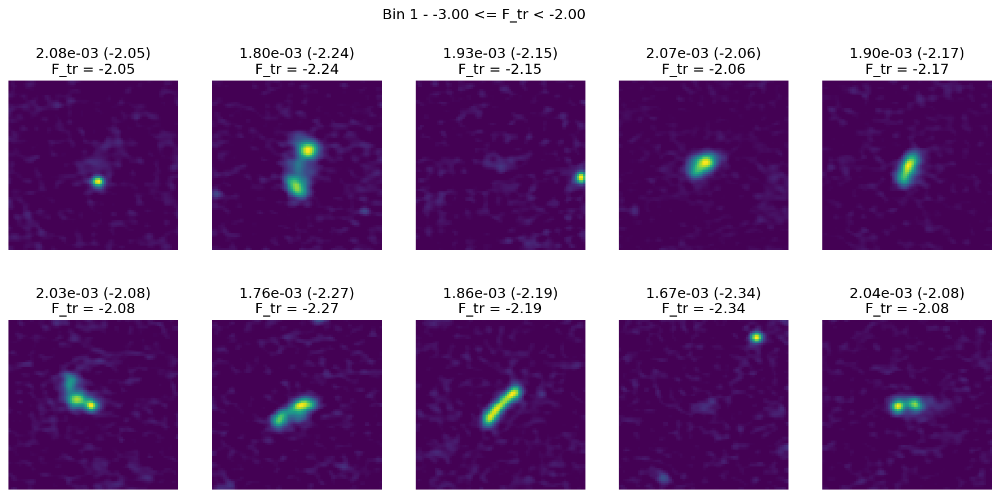

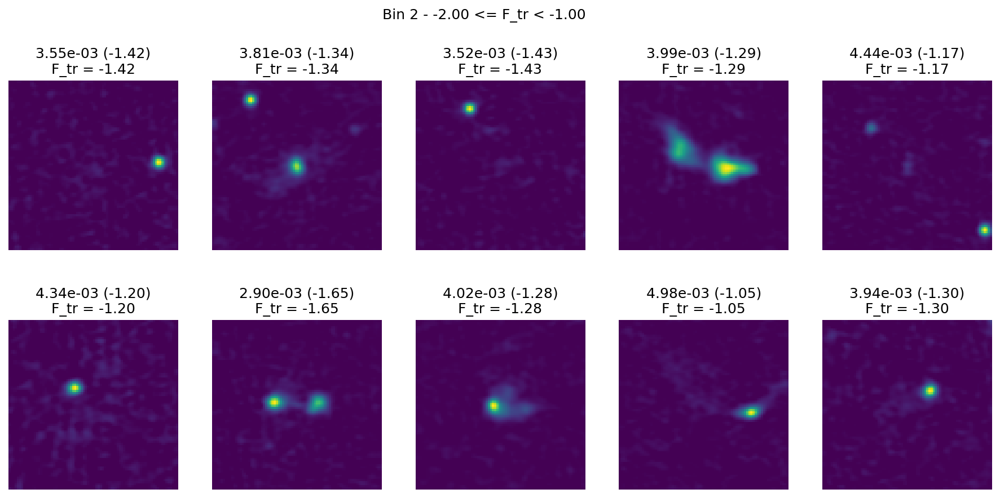

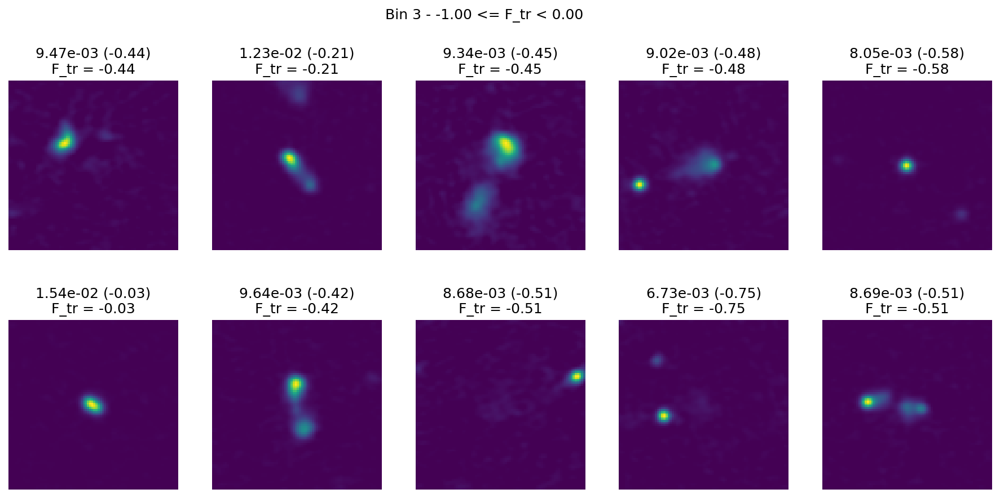

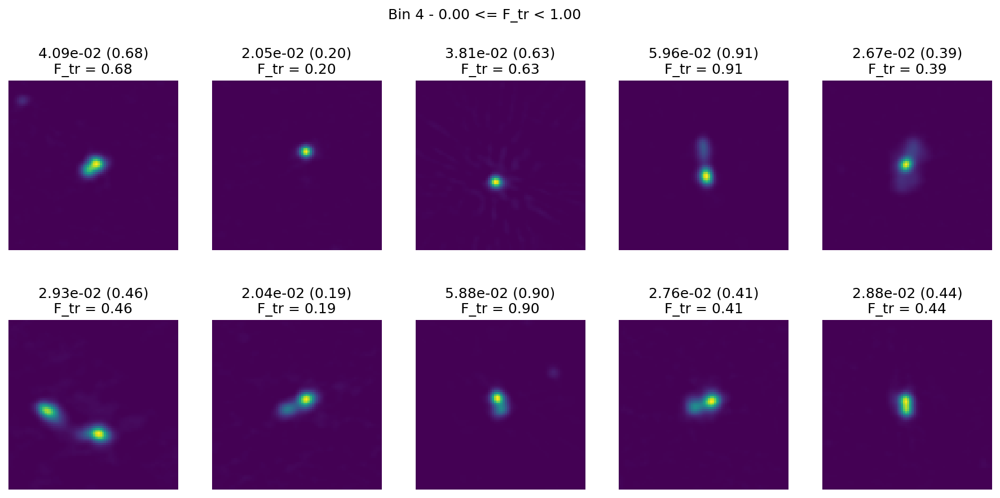

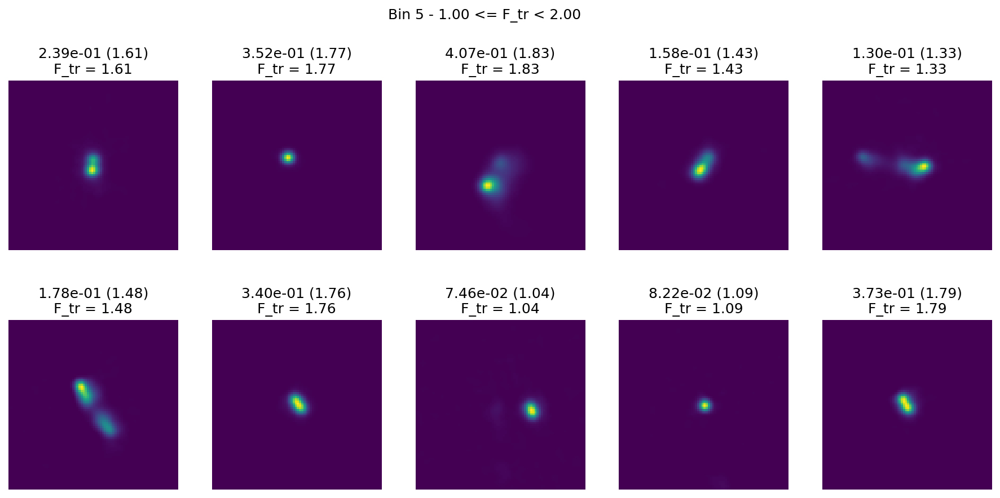

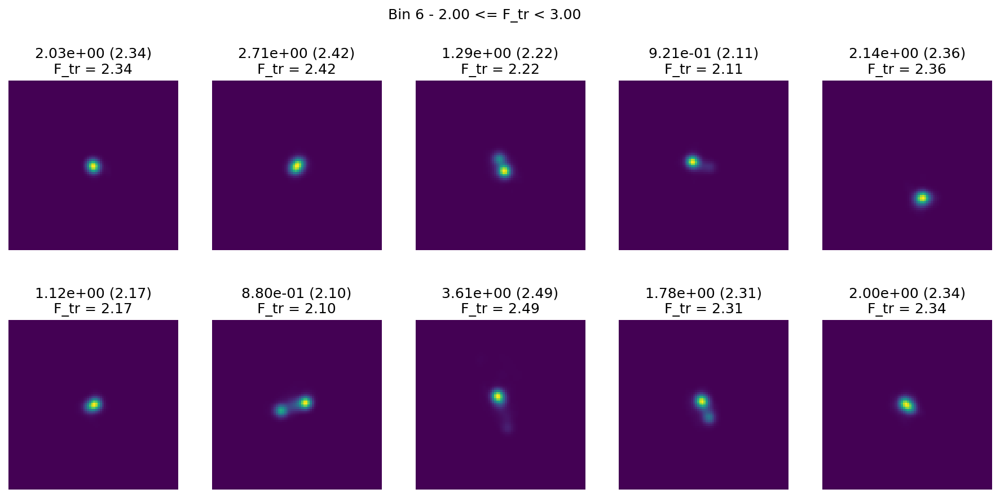

In [12]:
import numpy as np

metric_peek(
    dataset.max_values_tr,
    np.linspace(-3, 3, 7),
    dataset.data.squeeze().numpy(),
    names=[f'{mx:.2e} ({mx_tr:.2f})' for mx, mx_tr in zip(dataset.max_values, dataset.max_values_tr)],
    metric_name='F_tr'
)

# Loss vs Pixel Value

In [2]:
import torch
import numpy as np
from tqdm import tqdm
from torch.utils.data import DataLoader
from model.diffusion import EDM_Diffusion
import utils.init_utils as init
from utils.data_utils import TrainDataset
from utils.device_utils import distribute_model
from utils.paths import LOFAR_SUBSETS, ANALYSIS_PARENT, MODEL_PARENT

model_name = f'Unclipped_H5'
lofar_subset = LOFAR_SUBSETS['unclipped_H5']

# Set up paths
model_dir = MODEL_PARENT / model_name
out_dir = ANALYSIS_PARENT / model_name
out_dir.mkdir(exist_ok=True) 

# Load diffusion and data
diffusion = EDM_Diffusion(timesteps=25)
dataset = TrainDataset(lofar_subset)
dataloader = DataLoader(dataset, batch_size=1000, shuffle=True)

# Load model
model = init.load_model_from_folder(model_dir)
model, dev_id = distribute_model(model)

# Set noise levels
noise_levels = [2e-3, 5e-1, 50]
losses = []
outputs = []

# Calculate loss
model.eval()
with torch.no_grad():
    batch = next(iter(dataloader)).to(f'cuda:{dev_id[0]}')
    for noise_level in tqdm(noise_levels, desc=f"Computing losses...", total=len(noise_levels)):
        sigmas = torch.full(
                    [batch.shape[0], 1, 1, 1], noise_level, device=batch.device    
                )
        loss, output = diffusion.edm_loss(
            model, batch, sigmas=sigmas, mean=False, return_output=True
            )
        losses.append(loss.detach().cpu().numpy())
        outputs.append(output.detach().cpu().numpy())

out_dict = {
    'batch': batch.detach().cpu().numpy(),
    'noise_levels': noise_levels,
    'losses': losses,
    'outputs': outputs,
}


np.savez(out_dir / f'{model_name}_pixel_value_losses.npz', **out_dict)

Loading images...
Data set initialized.
Loading model from /storage/tmartinez/results/Unclipped_H5/parameters_ema_Unclipped_H5.pt and /storage/tmartinez/results/Unclipped_H5/config_Unclipped_H5.json


Computing losses...: 100%|██████████| 3/3 [00:08<00:00,  2.70s/it]


In [2]:
from utils.paths import ANALYSIS_PARENT
import numpy as np

model_name = f'Unclipped_H5'
out_dir = ANALYSIS_PARENT / model_name

file_dict = np.load(out_dir / f'{model_name}_pixel_value_losses.npz')

In [19]:
list(file_dict.keys())

['batch', 'noise_levels', 'losses', 'outputs']

In [20]:
file_dict['noise_levels'].shape

(3,)

In [26]:
def weight(sigma, sigma_data=0.5):
    return (sigma**2 + sigma_data**2) / (sigma**2 * sigma_data**2)

batch_flat = file_dict['batch'].flatten()
losses_flat = file_dict['losses'].reshape(3, -1)
deltas = file_dict['outputs'] - file_dict['batch'][None, :]
deltas_flat = deltas.reshape(3, -1)

deltas_weighted = (
    np.sqrt(weight(file_dict['noise_levels'][:, None, None, None]))
    * deltas.squeeze()
)
deltas_weighted_flat = deltas_weighted.reshape(3, -1)

idx = np.digitize(batch_flat, np.linspace(0, 1, 256))

# put losses into bins
losses_binned = []
deltas_binned = []
deltas_weighted_binned = []
for sigma_value in range(3):

    sigma_loss_binned = []
    sigma_delta_binned = []
    sigma_delta_weighted_binned = []

    for i in range(256):
        # Loss histogram
        counts_loss, _ = np.histogram(
            losses_flat[sigma_value, idx == i], 
            bins=np.linspace(0, 5, 501)
        )
        sigma_loss_binned.append(counts_loss)

        # Delta histogram
        counts_delta, _ = np.histogram(
            deltas_flat[sigma_value, idx == i],
            bins=np.linspace(-2.5, 2.5, 501)
        )
        sigma_delta_binned.append(counts_delta)

        # Weighted delta histogram
        counts_delta_weighted, _ = np.histogram(
            deltas_weighted_flat[sigma_value, idx == i],
            bins=np.linspace(-2.5, 2.5, 501)
        )
        sigma_delta_weighted_binned.append(counts_delta_weighted)

    losses_binned.append(np.array(sigma_loss_binned))
    deltas_binned.append(np.array(sigma_delta_binned))
    deltas_weighted_binned.append(np.array(sigma_delta_weighted_binned))


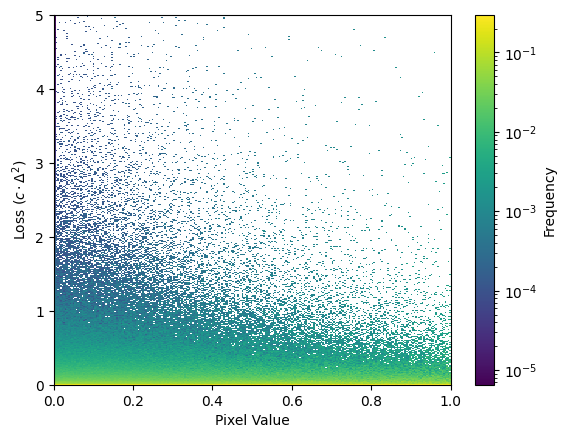

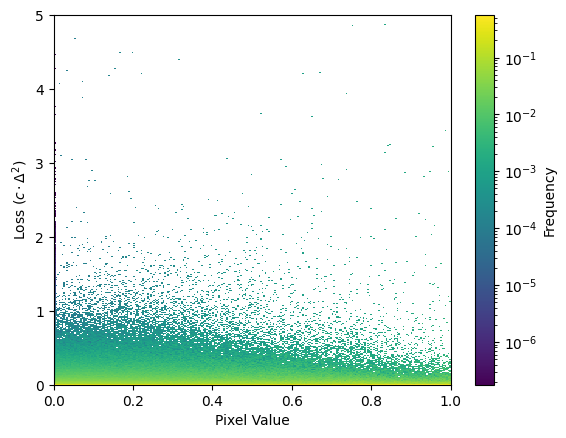

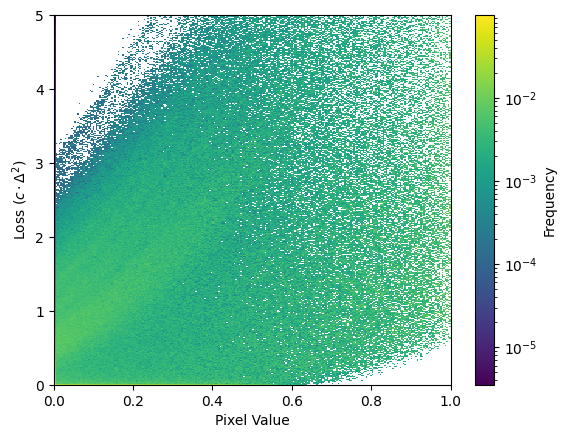

In [55]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

for counts in losses_binned:
    plt.colorbar(plt.imshow(
        (counts / counts.sum(axis=1)[:, None]).T, aspect='auto', origin='lower',
        extent=[0, 1, 0, 5], norm=LogNorm(), interpolation='none'
    ), label='Frequency')

    plt.xlabel('Pixel Value')
    plt.ylabel('Loss $(c \cdot \Delta^2)$')
    plt.show()

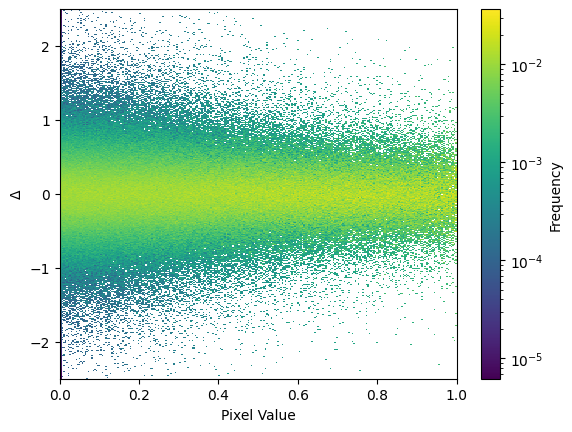

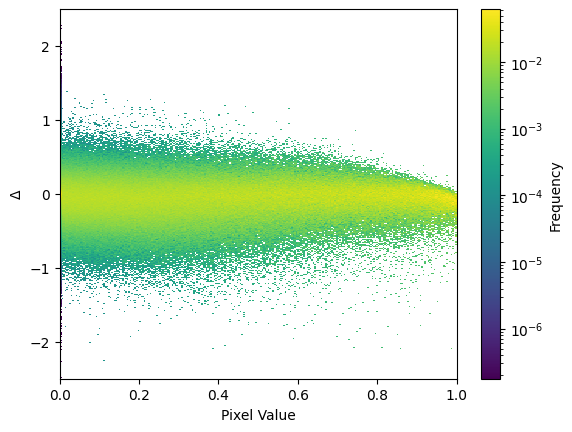

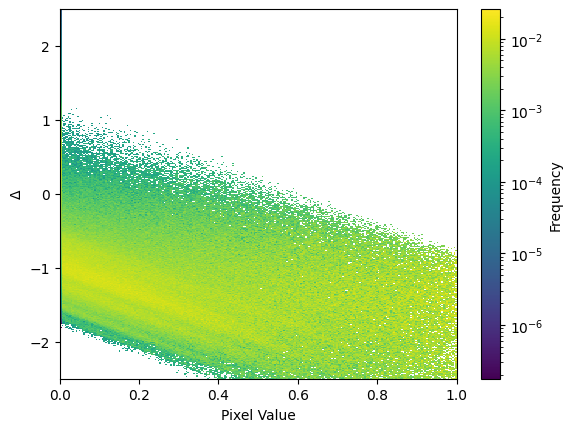

In [27]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

for counts in deltas_weighted_binned:
    plt.colorbar(plt.imshow(
        (counts / counts.sum(axis=1)[:, None]).T, aspect='auto', origin='lower',
        extent=[0, 1, -2.5, 2.5], norm=LogNorm(), interpolation='none'
    ), label='Frequency')

    plt.xlabel('Pixel Value')
    plt.ylabel('$\Delta$')
    plt.show()

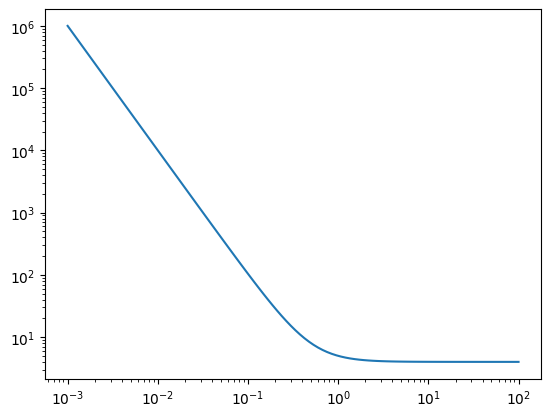

In [18]:
def weight(sigma, sigma_data=0.5):
    return (sigma**2 + sigma_data**2) / (sigma**2 * sigma_data**2)

sigma = np.logspace(-3, 2, 100)

plt.plot(sigma, weight(sigma))
plt.yscale('log')
plt.xscale('log')

# Find Closest Matching Images

In [ ]:
from utils.data_utils import EvaluationDataset
from torch.utils.data import DataLoader

LOFAR_PATH = Path("/home/bbd0953/diffusion/image_data/lofar_zoom_unclipped_subset_80p")
GEN_PATH = Path("/home/bbd0953/diffusion/image_data/generated/samples_EDM_valFix_T=50")

dataloader_lofar = DataLoader(dataset_lofar := EvaluationDataset(LOFAR_PATH))
dataloader_gen = DataLoader(dataset_gen := EvaluationDataset(GEN_PATH))